In [1]:
import pandas as pd
import numpy as np
import matplotlib as matplot
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_columns', None)

In [2]:
## Global output settings

plt.rcParams['figure.dpi'] = 300  # Change to your desired DPI
sns.set(context="talk", font_scale=1)
sns.set_style("white")

In [3]:
# Read assessment data from district dashbaord
results_df=pd.read_excel('Resources/reading_math_results.xlsx')
results_df.head()

C:\Users\mcyang\AppData\Local\miniconda3\envs\dev\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date
0,C&T,0527,"Reyes Guaman, Jenry",3669515.0,11.0,Hispanic,Well Below Target,NaN,2024-12-05,NaN,NaN,NaT
1,ABEC,302AT,"Jefferson, Fred D. Jr",3662319.0,15.0,Black or African American,Well Below Target,NaN,2024-12-05,Well Below Target,NaN,2024-10-02
2,SEC,302S,"Sable, Grady C.",3677023.0,8.0,White,Well Below Target,NaN,2024-12-04,NaN,NaN,NaT
3,ABEC,302A,"Smith, Teshome C.",3648655.0,10.0,Black or African American,Well Below Target,NaN,2024-12-04,NaN,NaN,NaT
4,ABEC,302A,"Tyus, Hattie S.",133893.0,10.0,Black or African American,Well Below Target,NaN,2024-12-04,Well Below Target,NaN,2024-10-01


In [4]:
# Get count of reading results
results_df['Most Recent Reading'].value_counts()

Most Recent Reading
Well Below Target    349
Well Above Target     61
Below Target          60
Above Target          58
Name: count, dtype: int64

In [6]:
# Code reading level
results_df.loc[results_df['Most Recent Reading']=='Well Below Target', 'Reading Level']=1
results_df.loc[results_df['Most Recent Reading']=='Below Target', 'Reading Level']=2
results_df.loc[results_df['Most Recent Reading']=='Above Target', 'Reading Level']=3
results_df.loc[results_df['Most Recent Reading']=='Well Above Target', 'Reading Level']=4
results_df['Reading Level'].value_counts()

Reading Level
1.0    349
4.0     61
2.0     60
3.0     58
Name: count, dtype: int64

In [7]:
# results_df=results_df.sort_values('Reading Level')

In [8]:
results_df.groupby('Site')['Program'].value_counts()

Site  Program
ABEC  302A        34
      302AT       26
      303A         3
      303AT        3
C&T   0527        26
      0533        20
      0535        16
CTC   0801        34
      301CT       15
      0032         1
ITI   0422         2
NEC   302N       103
      0772        24
      303N        23
SEC   302S        74
      0622        32
      303S         3
WEC   0800        83
      302W        18
      302WT       15
      303W        13
      303WT        4
Name: count, dtype: int64

In [10]:
nec_sped=['302N', '303N']
wec_sped=['302W', '302WT', '303W', '303WT']
sec_sped=['302S', '303S', '303ST']

results_df.loc[results_df['Program'].isin(nec_sped), 'School']='NEC SPED'
results_df.loc[results_df['Program'].isin(wec_sped), 'School']='WEC SPED'
results_df.loc[results_df['Program'].isin(sec_sped), 'School']='SEC SPED'
results_df.loc[results_df['Program']=='0772', 'School']='NECA'
results_df.loc[results_df['Program']=='0622', 'School']='SECA'
results_df.loc[results_df['Program']=='0800', 'School']='W-ALT'
results_df.loc[results_df['Program']=='0801', 'School']='CTC Gateway'
results_df.loc[results_df['Program']=='301CT', 'School']='CTC Transition'
results_df.loc[results_df['Program']=='0032', 'School']='CTC Pathways'
results_df.loc[results_df['Site']=='ABEC', 'School']='ABEC'
results_df['School'].value_counts()

School
NEC SPED          126
W-ALT              83
SEC SPED           77
ABEC               66
WEC SPED           50
CTC Gateway        34
SECA               32
NECA               24
CTC Transition     15
CTC Pathways        1
Name: count, dtype: int64

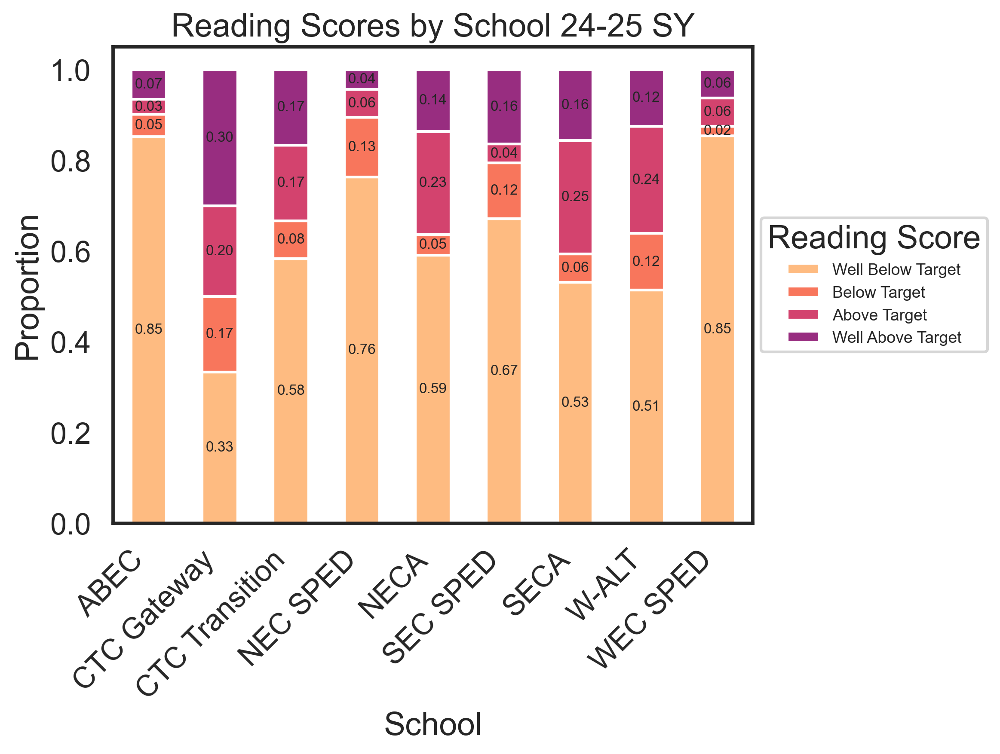

In [11]:
# Reading scores by school

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = results_df.groupby('School')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'Reading Scores by School 24-25 SY')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/reading_by_school', bbox_inches='tight')

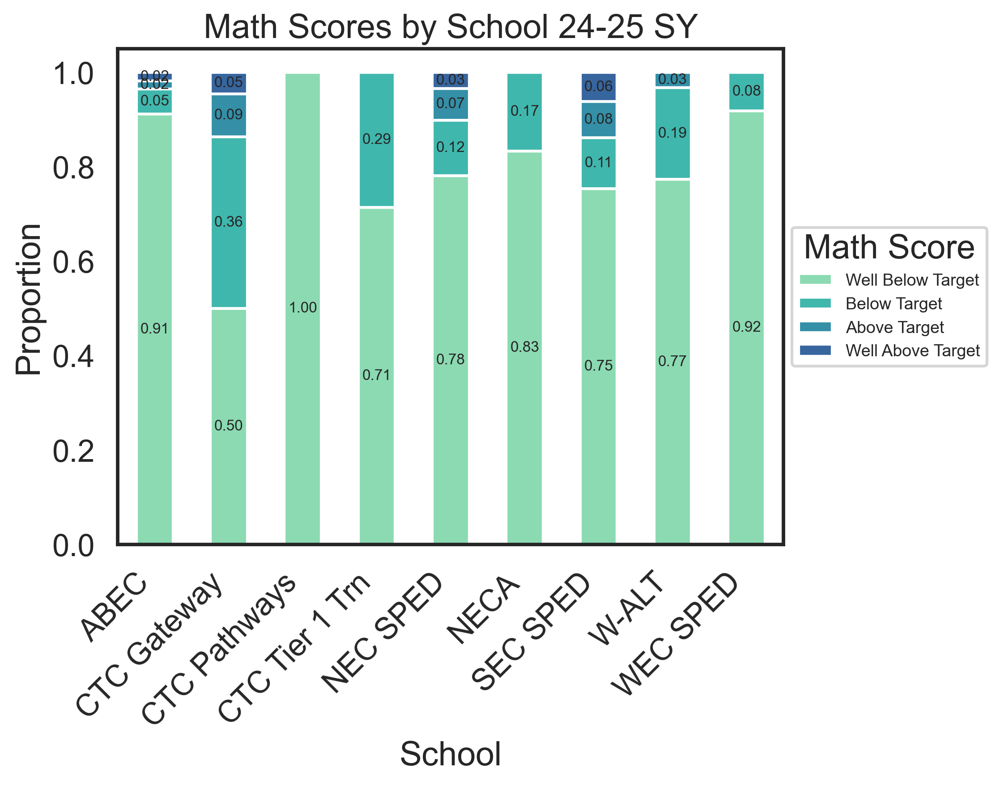

In [11]:
# Math scores by school

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']

stacked_df  = results_df.groupby('School')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'Math Scores by School 24-25 SY')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/math_by_school', bbox_inches='tight')

## NECA

In [12]:
neca_df=results_df[results_df['School']=='NECA']
neca_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
64,NEC,0772,"Fullman, Quion M.",3663329.0,12.0,Black or African American,Above Target,NaN,2024-10-25,Well Below Target,NaN,2024-10-24,3.0,NECA
66,NEC,0772,"Malmstedt, Nathan G.",3677988.0,11.0,White,Well Above Target,NaN,2024-10-24,Well Below Target,NaN,2024-10-24,4.0,NECA
68,NEC,0772,"Sanchez, Arely I.",3663635.0,12.0,Hispanic,Well Below Target,NaN,2024-10-23,Well Below Target,NaN,2024-10-24,1.0,NECA
70,NEC,0772,"Clover, Serenity J.",3679878.0,10.0,Black or African American,Well Below Target,NaN,2024-10-22,Well Below Target,NaN,2024-10-24,1.0,NECA
71,NEC,0772,"Earhart, Charlotte A.",3667836.0,10.0,White,Well Below Target,NaN,2024-10-22,Well Below Target,NaN,2024-10-24,1.0,NECA


In [13]:
neca_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24 entries, 64 to 551
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Site                 24 non-null     object        
 1   Program              24 non-null     object        
 2   Student              24 non-null     object        
 3   District287 Id       24 non-null     float64       
 4   Grade                24 non-null     float64       
 5   Reported Race        24 non-null     object        
 6   Most Recent Reading  22 non-null     object        
 7   F-S Read Growth      0 non-null      float64       
 8   Reading Date         22 non-null     datetime64[ns]
 9   Most Recent Math     18 non-null     object        
 10  F-S Math Growth      0 non-null      float64       
 11  Math Date            18 non-null     datetime64[ns]
 12  Reading Level        22 non-null     float64       
 13  School               24 non-null     obj

In [14]:
# Race counts of students with reading scores
neca_df[~neca_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()

In [15]:
neca_reading=neca_df['Most Recent Reading'].value_counts()
neca_reading

Most Recent Reading
Well Below Target    13
Above Target          5
Well Above Target     3
Below Target          1
Name: count, dtype: int64

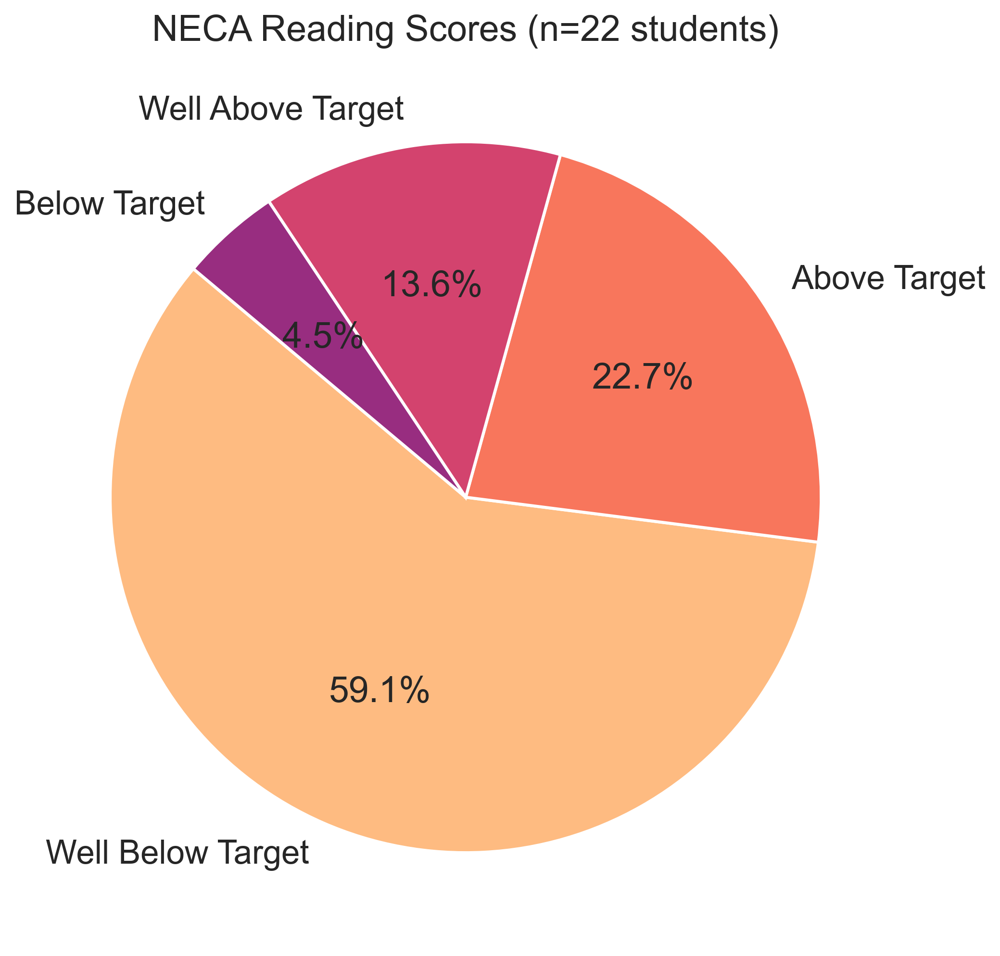

In [16]:
count=neca_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(neca_reading, labels=neca_reading.index, autopct='%1.1f%%', startangle=140)

plt.title(f'NECA Reading Scores (n={count} students)')
plt.savefig('Outputs/neca_reading')
plt.show()

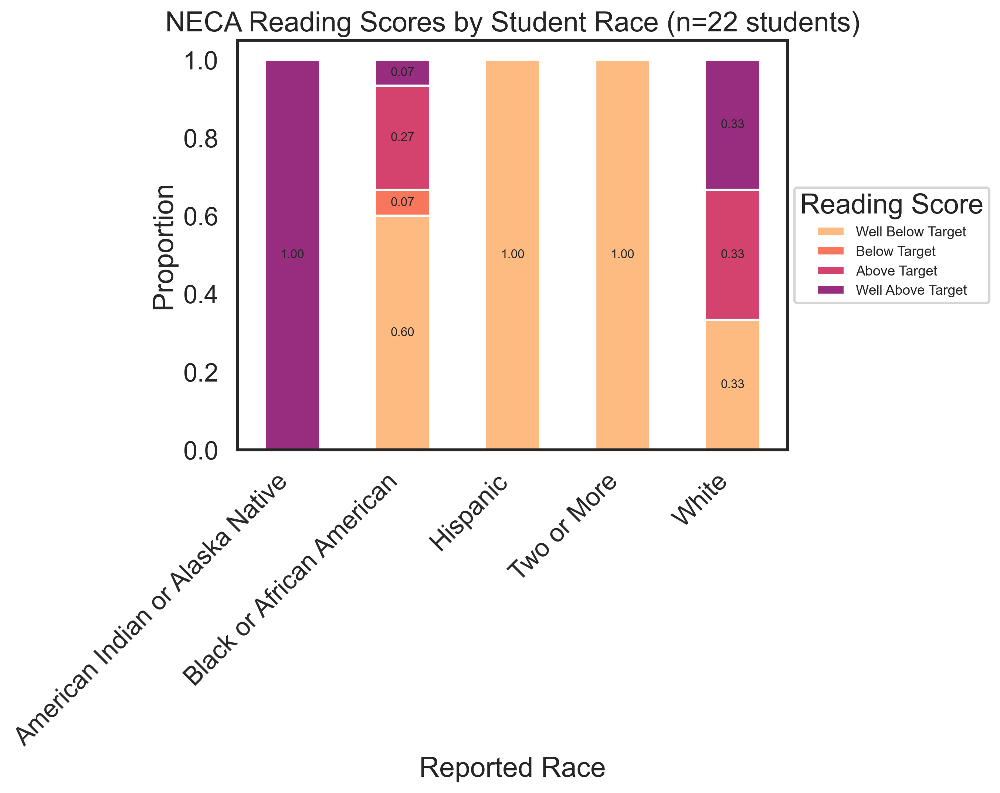

In [17]:
# Stacked Chart by Race

count=neca_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = neca_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'NECA Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/neca_reading_by_race', bbox_inches='tight')

In [18]:
neca_math=neca_df['Most Recent Math'].value_counts()
neca_math

Most Recent Math
Well Below Target    15
Below Target          3
Name: count, dtype: int64

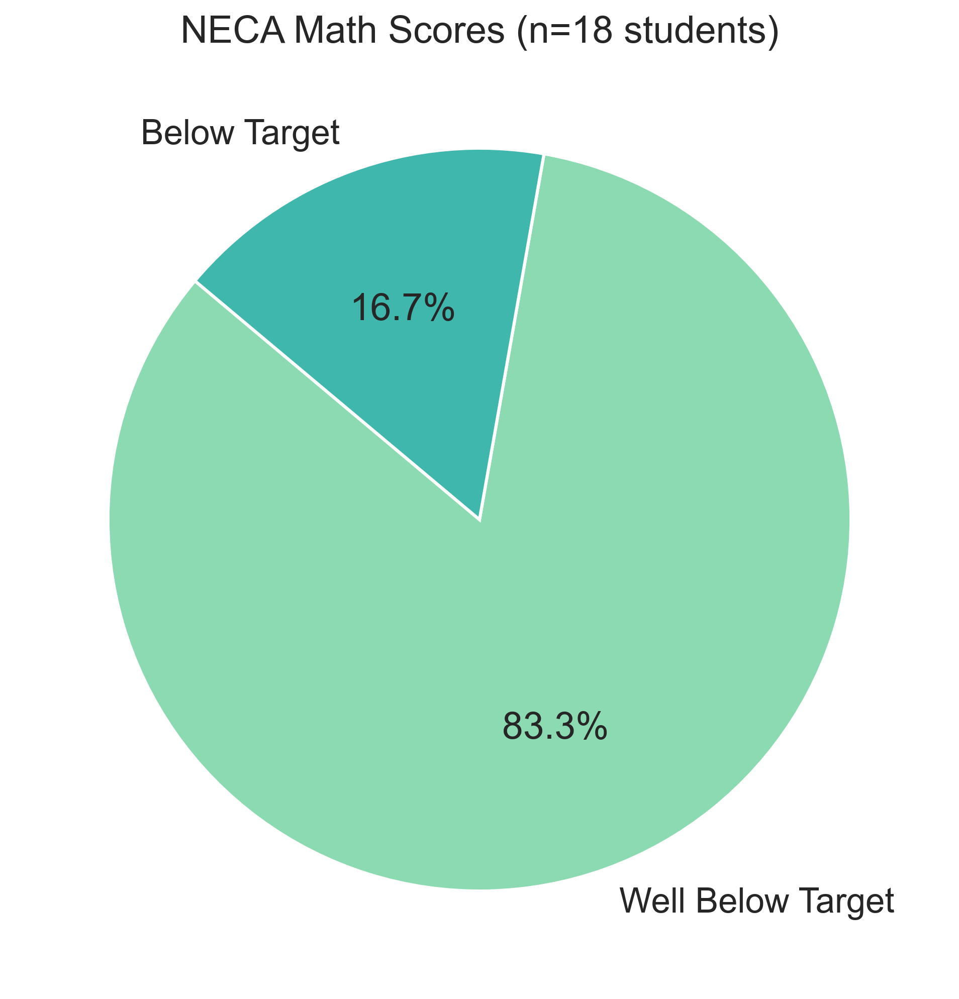

In [19]:
count=neca_df['Most Recent Math'].count()

sns.set_palette('mako_r')
plt.figure(figsize=(8, 8))

plt.pie(neca_math, labels=neca_math.index, autopct='%1.1f%%', startangle=140)

plt.title(f'NECA Math Scores (n={count} students)')
plt.savefig('Outputs/neca_math')
plt.show()

In [21]:
# Race counts of students with math scores
neca_df[~neca_df['Most Recent Math'].isna()]['Reported Race'].value_counts().to_clipboard()

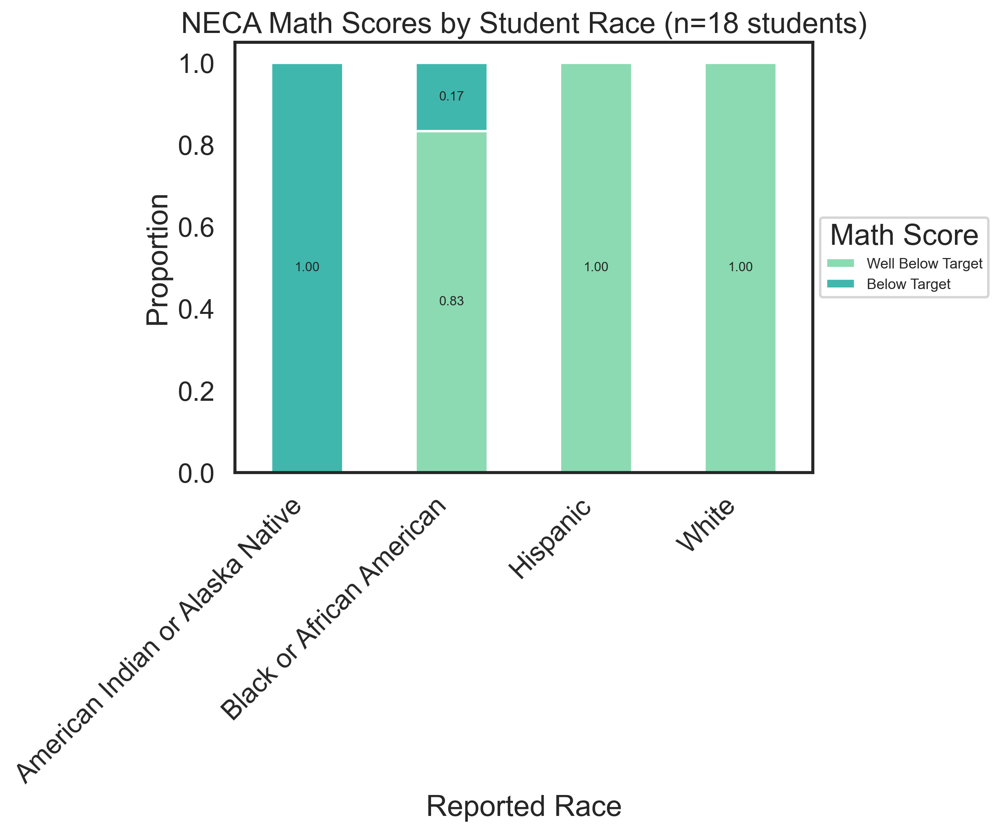

In [22]:
# Stacked Chart by Race

count=neca_df['Most Recent Math'].count()

# stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_order=['Well Below Target', 'Below Target']

stacked_df  = neca_df.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'NECA Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/neca_math_by_race', bbox_inches='tight')

## NEC

In [23]:
nec_df=results_df[results_df['School']=='NEC SPED']
nec_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
331,NEC,302N,"Smith, Ja'Aun A.",3665471.0,3.0,Black or African American,Well Below Target,NaN,2024-09-12,Well Below Target,NaN,2024-09-13,1.0,NEC SPED
321,NEC,302N,"Shepherd, Joe'Von L.",3640795.0,11.0,Black or African American,Well Below Target,NaN,2024-09-13,Well Below Target,NaN,2024-09-13,1.0,NEC SPED
318,NEC,303N,"Otita, Dominic T.",3654831.0,8.0,Hispanic,Well Below Target,NaN,2024-09-13,Well Below Target,NaN,2024-09-20,1.0,NEC SPED
317,NEC,303N,"McCarty, Andre' J.",124709.0,8.0,Black or African American,Well Below Target,NaN,2024-09-13,Well Below Target,NaN,2024-09-25,1.0,NEC SPED
316,NEC,302N,"Dempsey, AJ M.",101529.0,7.0,Black or African American,Well Below Target,NaN,2024-09-13,Well Below Target,NaN,2024-09-13,1.0,NEC SPED


In [24]:
nec_reading=nec_df['Most Recent Reading'].value_counts()
nec_reading

Most Recent Reading
Well Below Target    87
Below Target         15
Above Target          7
Well Above Target     5
Name: count, dtype: int64

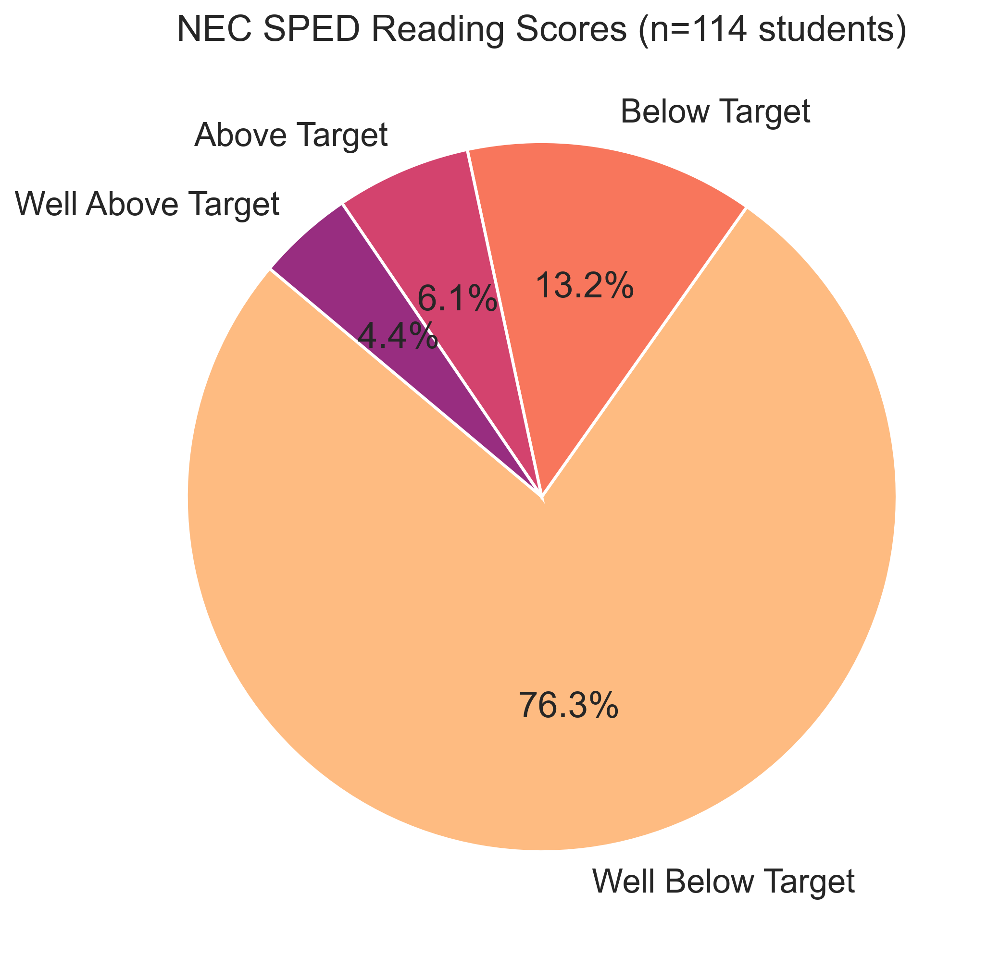

In [113]:
count=nec_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(nec_reading, labels=nec_reading.index, autopct='%1.1f%%', startangle=140)

plt.title(f'NEC SPED Reading Scores (n={count} students)')
plt.savefig('Outputs/nec_reading')
plt.show()

In [26]:
nec_df[~nec_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()

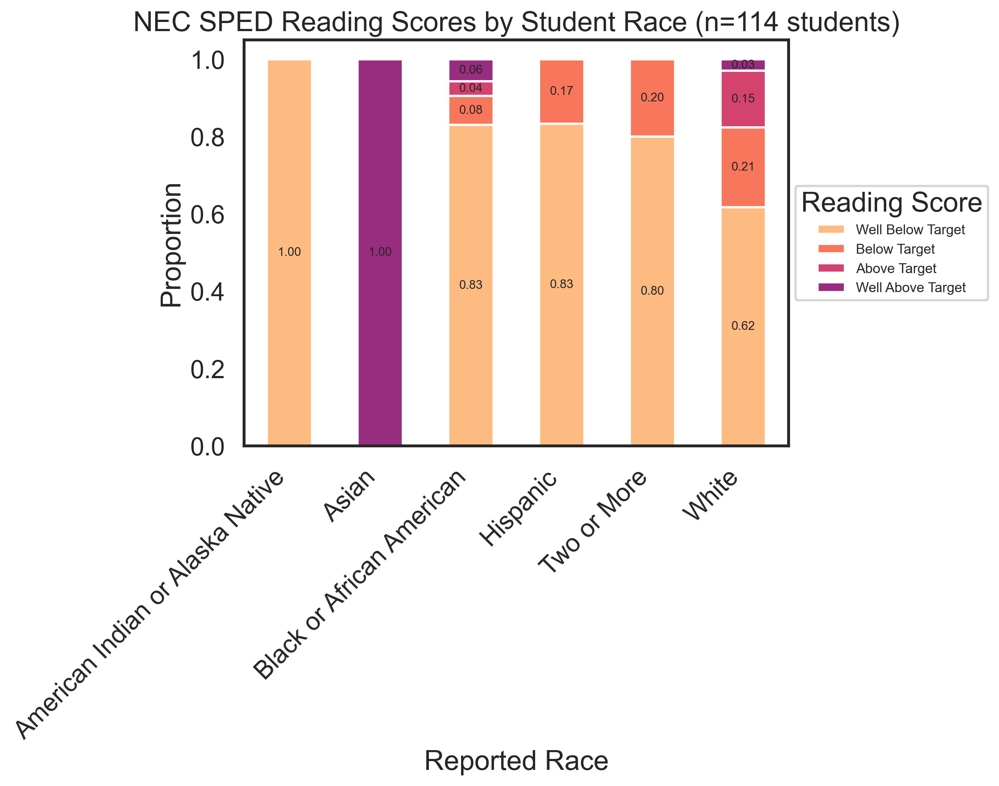

In [27]:
# Stacked Chart by Race

count=nec_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = nec_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'NEC SPED Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/nec_reading_by_race', bbox_inches='tight')

In [28]:
nec_math=nec_df['Most Recent Math'].value_counts()
nec_math

Most Recent Math
Well Below Target    93
Below Target         14
Above Target          8
Well Above Target     4
Name: count, dtype: int64

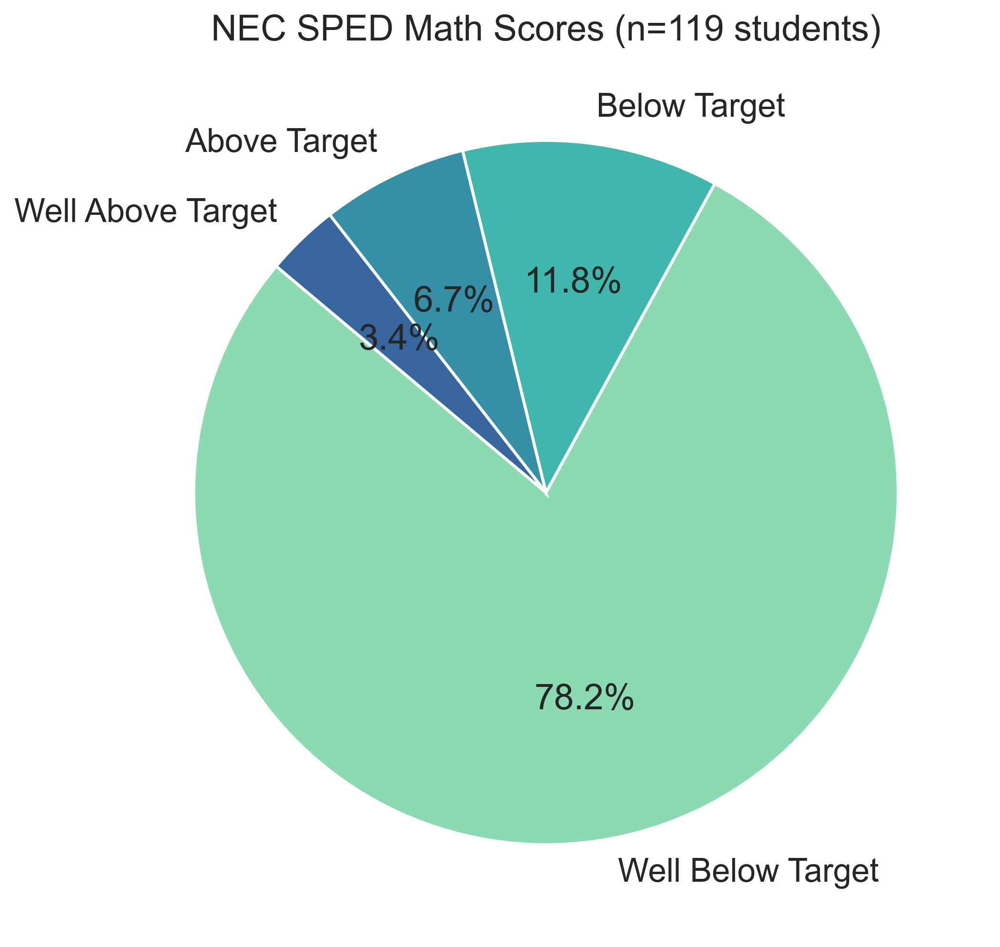

In [111]:
count=nec_df['Most Recent Math'].count()

sns.set_palette('mako_r')
plt.figure(figsize=(8, 8))

plt.pie(nec_math, labels=nec_math.index, autopct='%1.1f%%', startangle=140)

plt.title(f'NEC SPED Math Scores (n={count} students)')
plt.savefig('Outputs/nec_math')
plt.show()

In [30]:
nec_df[~nec_df['Most Recent Math'].isna()]['Reported Race'].value_counts().to_clipboard()

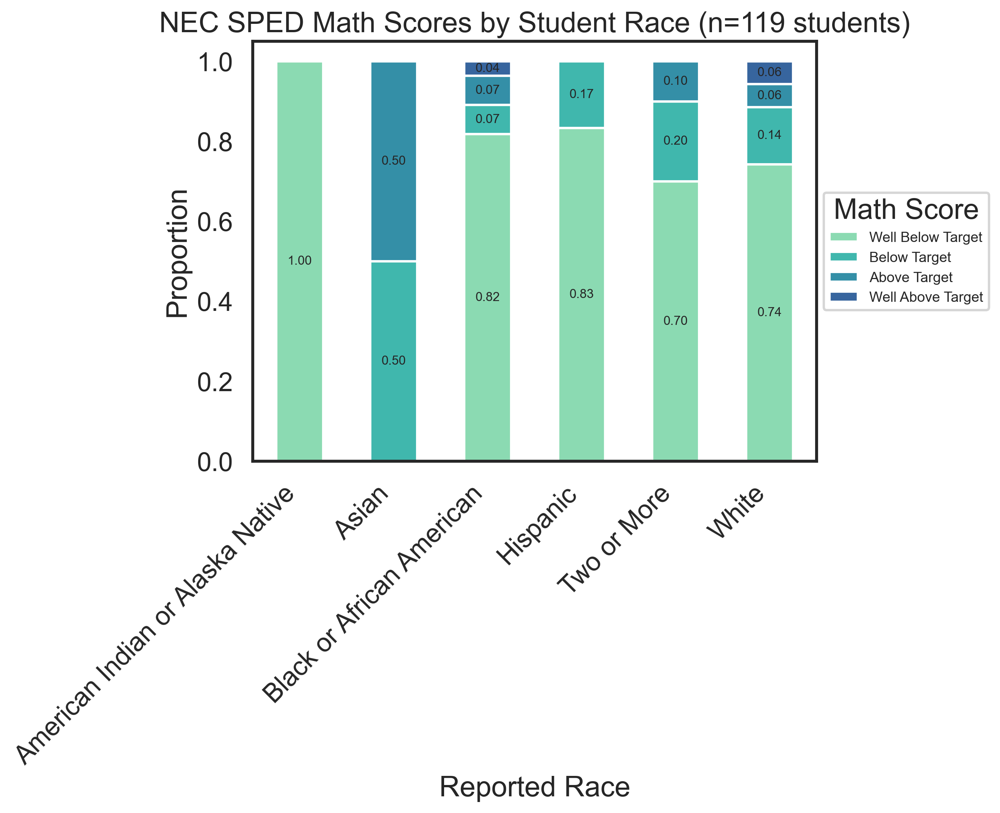

In [31]:
# Stacked Chart by Race

count=nec_df['Most Recent Math'].count()

# stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']

stacked_df  = nec_df.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'NEC SPED Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/nec_math_by_race', bbox_inches='tight')

## SEC

In [32]:
sec_df=results_df[results_df['School']=='SEC SPED']
sec_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
332,SEC,302S,"Prinkkila, Maximum G.",3660920.0,4.0,White,Well Below Target,NaN,2024-09-12,Below Target,NaN,2024-09-10,1.0,SEC SPED
333,SEC,302S,"Ball, Demoni T.",3676748.0,5.0,Black or African American,Well Below Target,NaN,2024-09-12,Well Below Target,NaN,2024-09-10,1.0,SEC SPED
301,SEC,302S,"Mickens, Thais J.",3678853.0,1.0,Black or African American,Well Below Target,NaN,2024-09-16,Below Target,NaN,2024-09-19,1.0,SEC SPED
300,SEC,302S,"Kesti, Owen H.",3676921.0,1.0,Asian,Well Below Target,NaN,2024-09-16,Well Below Target,NaN,2024-09-19,1.0,SEC SPED
351,SEC,302S,"Fitzgerald, Connor D.",3650981.0,11.0,White,Well Below Target,NaN,2024-09-12,NaN,NaN,NaT,1.0,SEC SPED


In [33]:
sec_reading=sec_df['Most Recent Reading'].value_counts()
sec_reading

Most Recent Reading
Well Below Target    49
Well Above Target    12
Below Target          9
Above Target          3
Name: count, dtype: int64

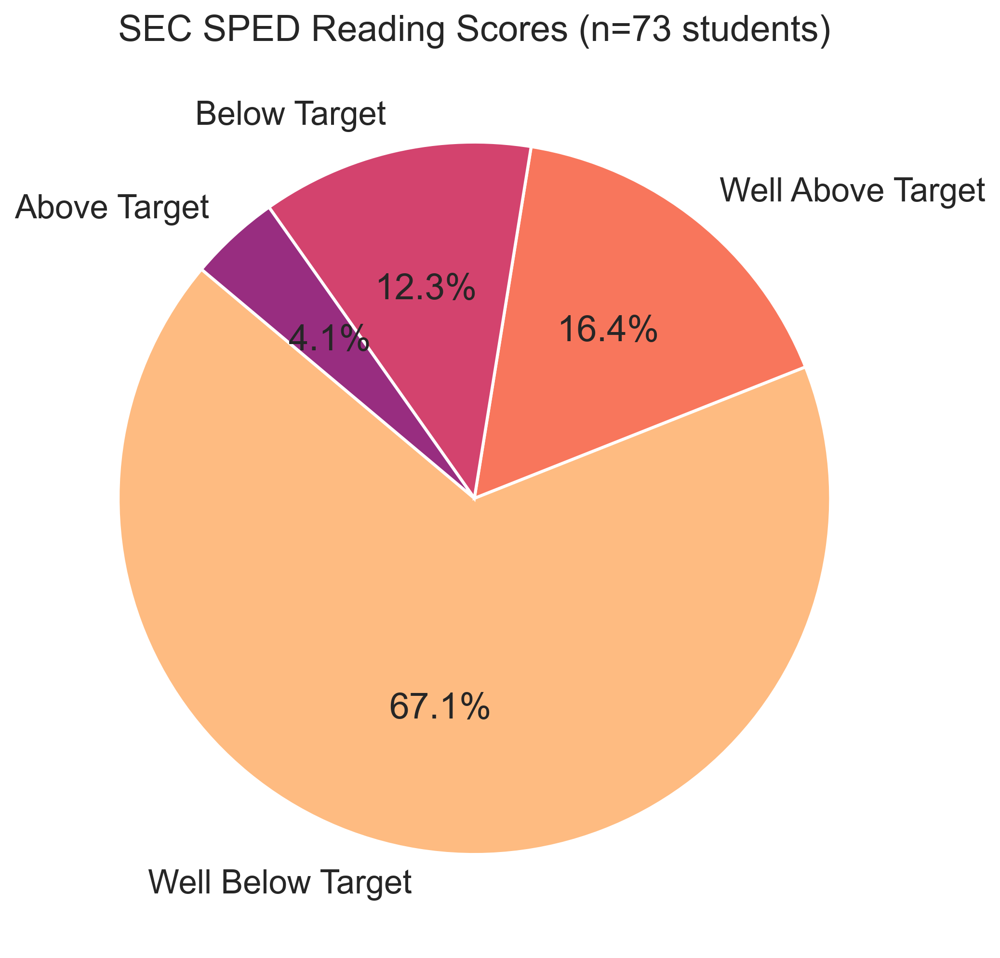

In [34]:
count=sec_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(sec_reading, labels=sec_reading.index, autopct='%1.1f%%', startangle=140)

sns.set(context="talk")
sns.set_style("white")
ax.set_facecolor("white")

plt.title(f'SEC SPED Reading Scores (n={count} students)')
plt.savefig('Outputs/sec_reading', dpi=300)
plt.show()

In [35]:
sec_df[~sec_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()

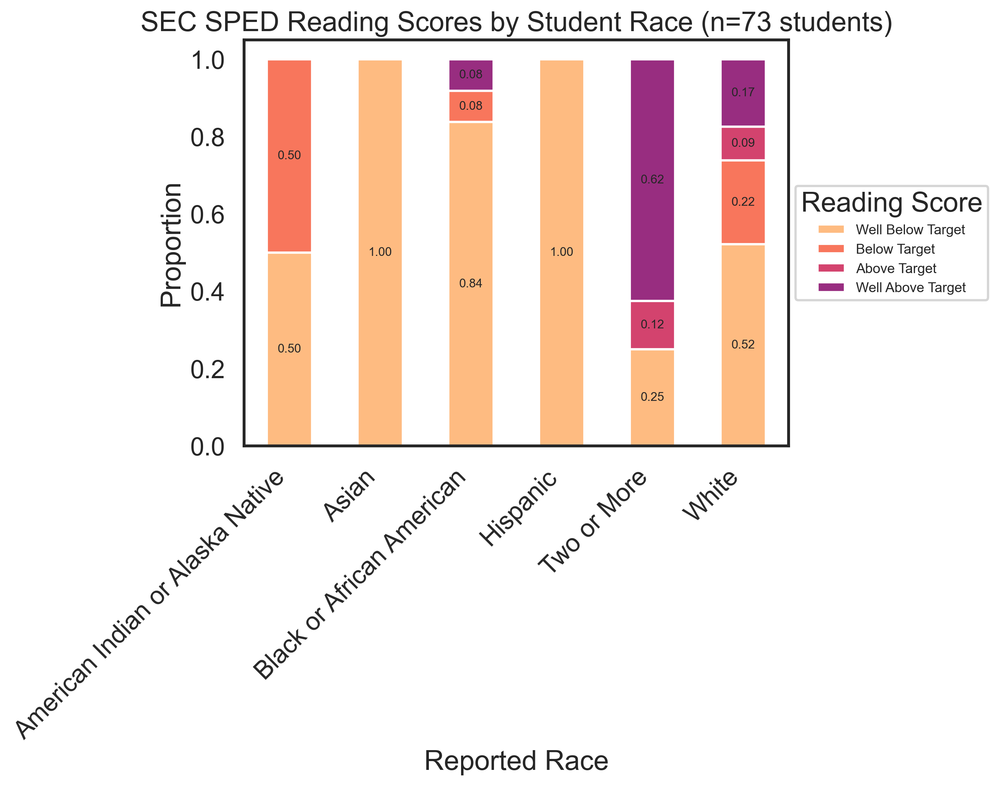

In [36]:
# Stacked Chart by Race

count=sec_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = sec_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'SEC SPED Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/sec_reading_by_race', bbox_inches='tight')

In [37]:
sec_math=sec_df['Most Recent Math'].value_counts()
sec_math

Most Recent Math
Well Below Target    49
Below Target          7
Above Target          5
Well Above Target     4
Name: count, dtype: int64

In [38]:
sec_df[~sec_df['Most Recent Math'].isna()]['Reported Race'].value_counts().to_clipboard()

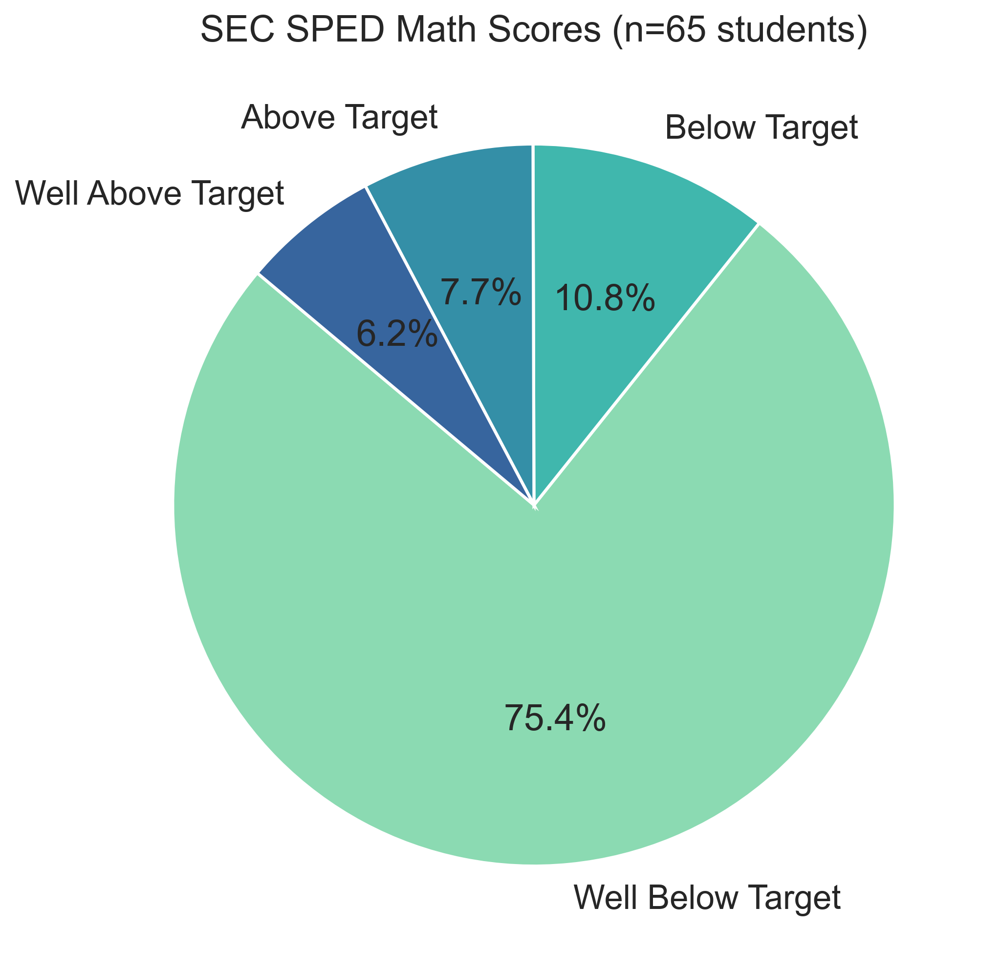

In [39]:
count=sec_df['Most Recent Math'].count()

sns.set_palette('mako_r')
plt.figure(figsize=(8, 8))

plt.pie(sec_math, labels=sec_math.index, autopct='%1.1f%%', startangle=140)

sns.set(context="talk")
sns.set_style("white")
ax.set_facecolor("white")

plt.title(f'SEC SPED Math Scores (n={count} students)')
plt.savefig('Outputs/sec_math', dpi=300)
plt.show()

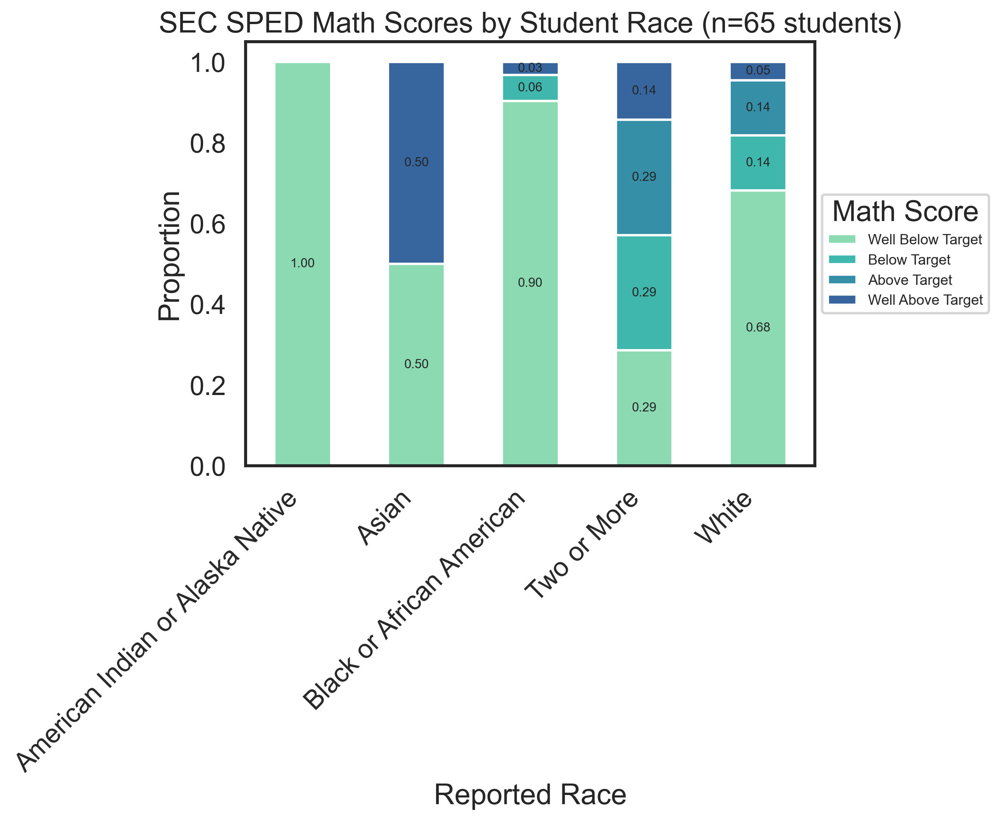

In [40]:
# Stacked Chart by Race

count=sec_df['Most Recent Math'].count()

# stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']

stacked_df  = sec_df.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'SEC SPED Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/sec_math_by_race', bbox_inches='tight')

## SECA

In [41]:
seca_df=results_df[results_df['School']=='SECA']
seca_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
240,SEC,0622,"Puga, Ricardo J. Jr",113020.0,12.0,American Indian or Alaska Native,Well Below Target,NaN,2024-09-23,NaN,NaN,NaT,1.0,SECA
238,SEC,0622,"Ibrahim, Zeinab K.",3676307.0,11.0,Black or African American,Well Below Target,NaN,2024-09-23,NaN,NaN,NaT,1.0,SECA
229,SEC,0622,"Sanchez Garzon, Exon A.",3676519.0,12.0,Hispanic,Well Below Target,NaN,2024-09-24,NaN,NaN,NaT,1.0,SECA
223,SEC,0622,"Allen, Myshalaya",3679473.0,11.0,Two or More,Well Below Target,NaN,2024-09-24,NaN,NaN,NaT,1.0,SECA
220,SEC,0622,"Rodriguez Ruiz, Nayeli",3658230.0,9.0,Hispanic,Well Below Target,NaN,2024-09-24,NaN,NaN,NaT,1.0,SECA


In [42]:
seca_reading=seca_df['Most Recent Reading'].value_counts()
seca_reading

Most Recent Reading
Well Below Target    17
Above Target          8
Well Above Target     5
Below Target          2
Name: count, dtype: int64

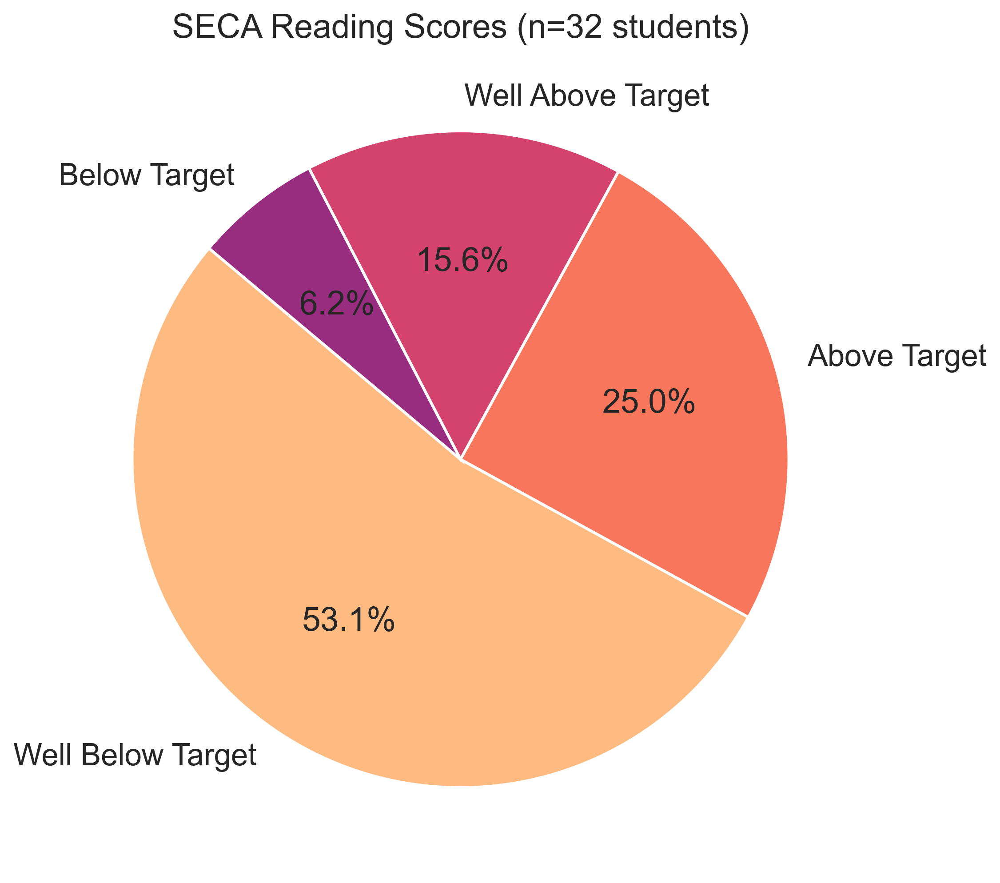

In [43]:
count=seca_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(seca_reading, labels=seca_reading.index, autopct='%1.1f%%', startangle=140)

plt.title(f'SECA Reading Scores (n={count} students)')
plt.savefig('Outputs/seca_reading')
plt.show()

In [44]:
seca_df[~seca_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()


C:\Users\mcyang\AppData\Local\Temp\ipykernel_17652\2446482951.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


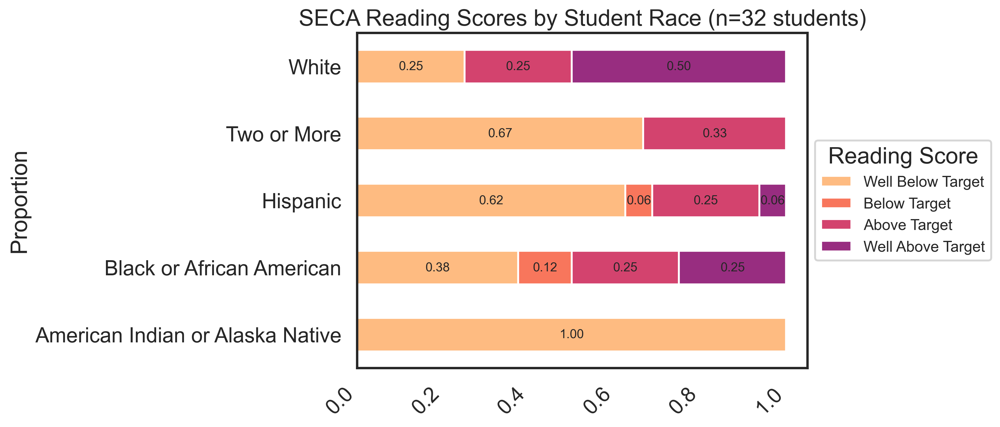

In [122]:
# Stacked Chart by Race

count=seca_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = seca_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.barh(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=12, bbox_to_anchor=(1, 0.5))

ax.set_title(f'SECA Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_width()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=10)

plt.savefig('Outputs/seca_reading_by_race', bbox_inches='tight')

In [46]:
seca_math=seca_df['Most Recent Math'].value_counts()
seca_math

Series([], Name: count, dtype: int64)

## WEC

In [47]:
wec_df=results_df[results_df['School']=='WEC SPED']
wec_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
327,WEC,303WT,"Gadegbeku, Isaiah Q.",104309.0,15.0,Black or African American,Well Below Target,NaN,2024-09-13,Well Below Target,NaN,2024-09-13,1.0,WEC SPED
310,WEC,303W,"Harvey, Gage A.",3679385.0,12.0,Two or More,Well Below Target,NaN,2024-09-16,NaN,NaN,NaT,1.0,WEC SPED
307,WEC,302W,"Moore, Zachary J.",129452.0,10.0,White,Well Below Target,NaN,2024-09-16,Well Below Target,NaN,2024-09-16,1.0,WEC SPED
357,WEC,303W,"Reynolds, Nehemiah J.",3676708.0,11.0,Two or More,Well Below Target,NaN,2024-09-12,Well Below Target,NaN,2024-09-24,1.0,WEC SPED
375,WEC,303W,"Larson, Elsa T.",3665813.0,12.0,Two or More,Well Below Target,NaN,2024-09-12,NaN,NaN,NaT,1.0,WEC SPED


In [48]:
wec_reading=wec_df['Most Recent Reading'].value_counts()
wec_reading

Most Recent Reading
Well Below Target    41
Above Target          3
Well Above Target     3
Below Target          1
Name: count, dtype: int64

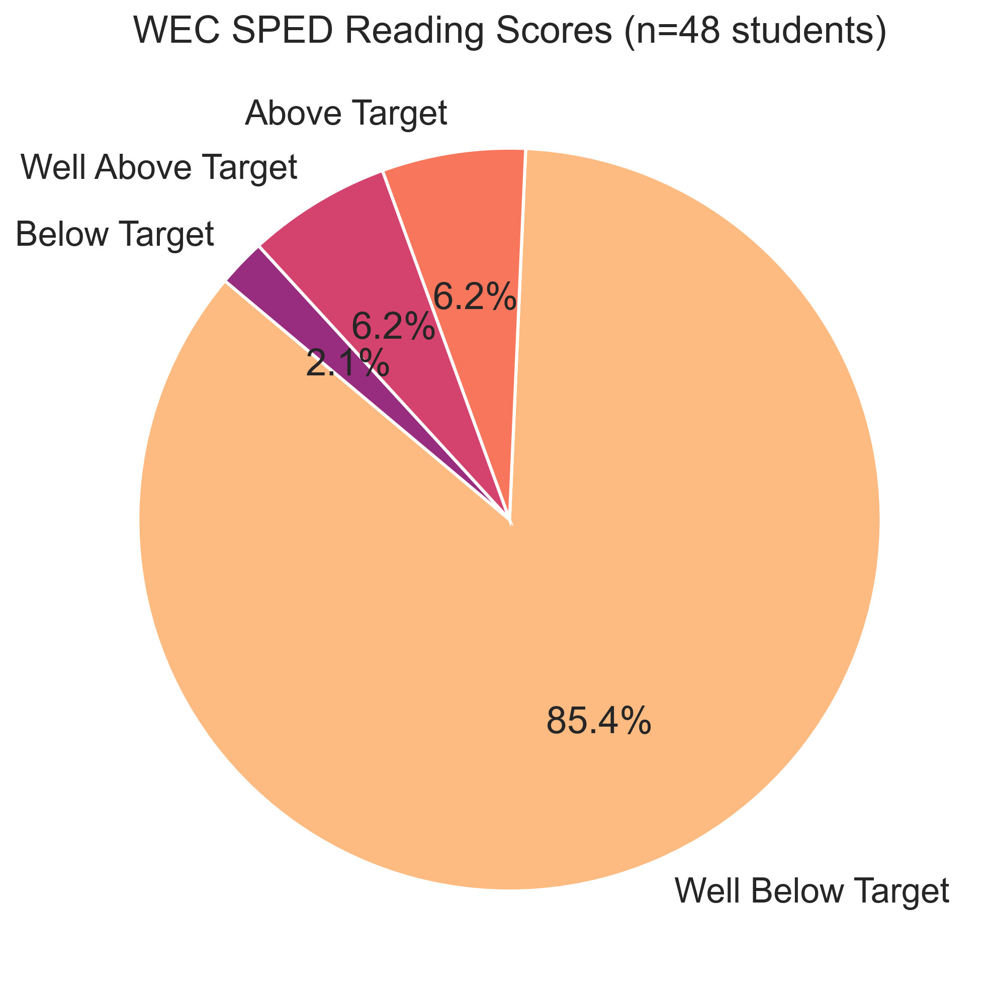

In [49]:
count=wec_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(wec_reading, labels=wec_reading.index, autopct='%1.1f%%', startangle=140)

plt.title(f'WEC SPED Reading Scores (n={count} students)')
plt.savefig('Outputs/wec_reading')
plt.show()

In [50]:
wec_df[~wec_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()

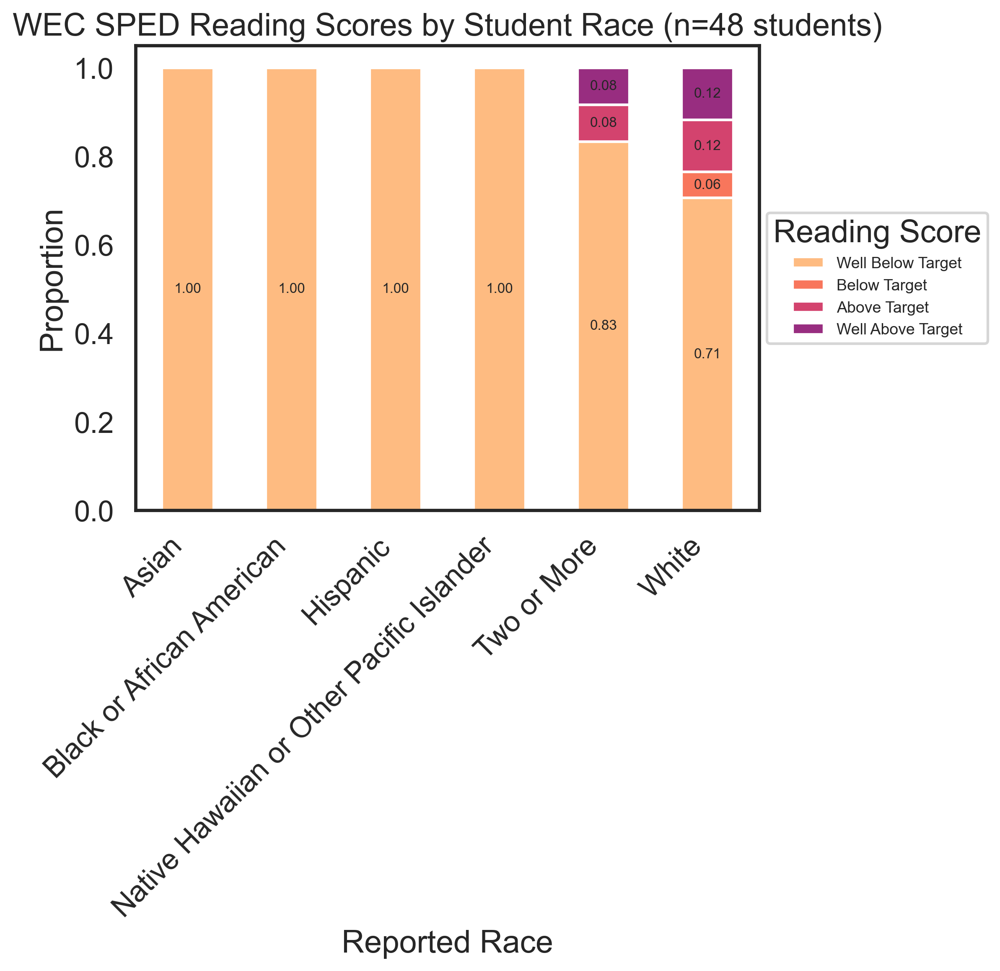

In [51]:
# Stacked Chart by Race

count=wec_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = wec_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'WEC SPED Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/wec_reading_by_race', bbox_inches='tight')

In [52]:
wec_math=wec_df['Most Recent Math'].value_counts()
wec_math

Most Recent Math
Well Below Target    34
Below Target          3
Name: count, dtype: int64

In [53]:
wec_df[~wec_df['Most Recent Math'].isna()]['Reported Race'].value_counts().to_clipboard()

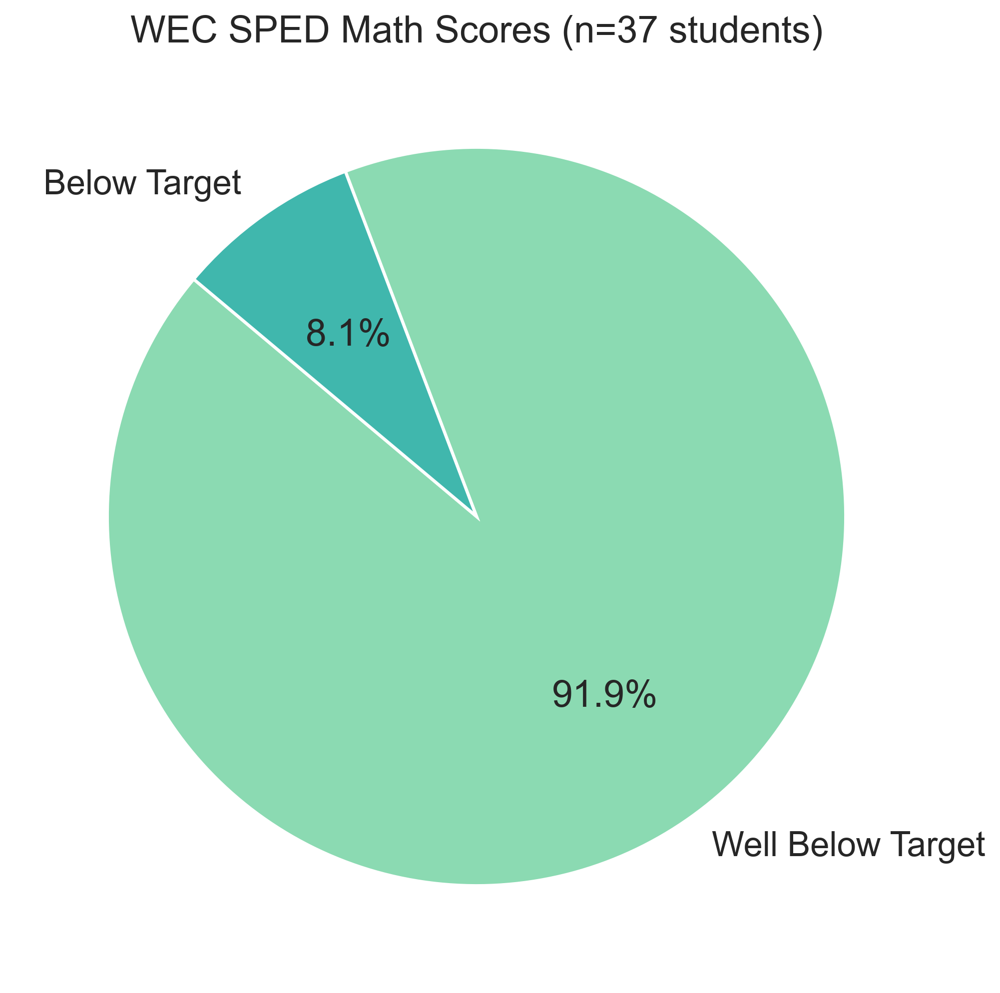

In [54]:
count=wec_df['Most Recent Math'].count()

sns.set_palette('mako_r')
plt.figure(figsize=(8, 8))

plt.pie(wec_math, labels=wec_math.index, autopct='%1.1f%%', startangle=140)

plt.title(f'WEC SPED Math Scores (n={count} students)')
plt.savefig('Outputs/wec_math')
plt.show()

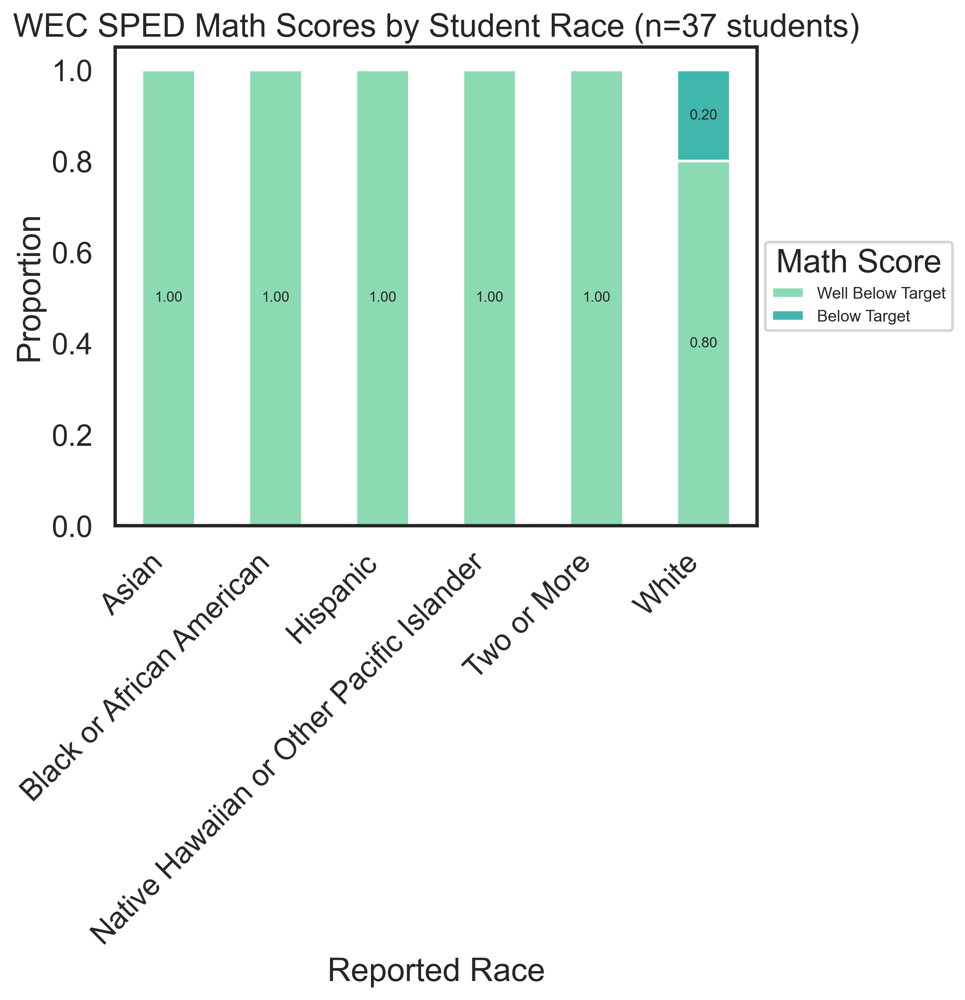

In [55]:
# Stacked Chart by Race

count=wec_df['Most Recent Math'].count()

# stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_order=['Well Below Target', 'Below Target']

stacked_df  = wec_df.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'WEC SPED Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/wec_math_by_race', bbox_inches='tight')

## W-ALT

In [56]:
walt_df=results_df[results_df['School']=='W-ALT']
walt_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
326,WEC,0800,"Perez, Yahiro",3643532.0,14.0,Hispanic,Well Below Target,NaN,2024-09-13,Well Below Target,NaN,2024-09-24,1.0,W-ALT
374,WEC,0800,"Kpodar, Sathya A.",113877.0,12.0,Black or African American,Well Below Target,NaN,2024-09-12,Well Below Target,NaN,2024-09-24,1.0,W-ALT
373,WEC,0800,"Kemp, Marisa M.",3676862.0,12.0,White,Well Below Target,NaN,2024-09-12,NaN,NaN,NaT,1.0,W-ALT
371,WEC,0800,"Hendricks, Vatoria S.",3679384.0,12.0,Black or African American,Well Below Target,NaN,2024-09-12,Well Below Target,NaN,2024-09-24,1.0,W-ALT
369,WEC,0800,"Garcia Abundiz, Angelo A.",113823.0,12.0,Hispanic,Well Below Target,NaN,2024-09-12,NaN,NaN,NaT,1.0,W-ALT


In [57]:
walt_reading=walt_df['Most Recent Reading'].value_counts()
walt_reading

Most Recent Reading
Well Below Target    37
Above Target         17
Below Target          9
Well Above Target     9
Name: count, dtype: int64

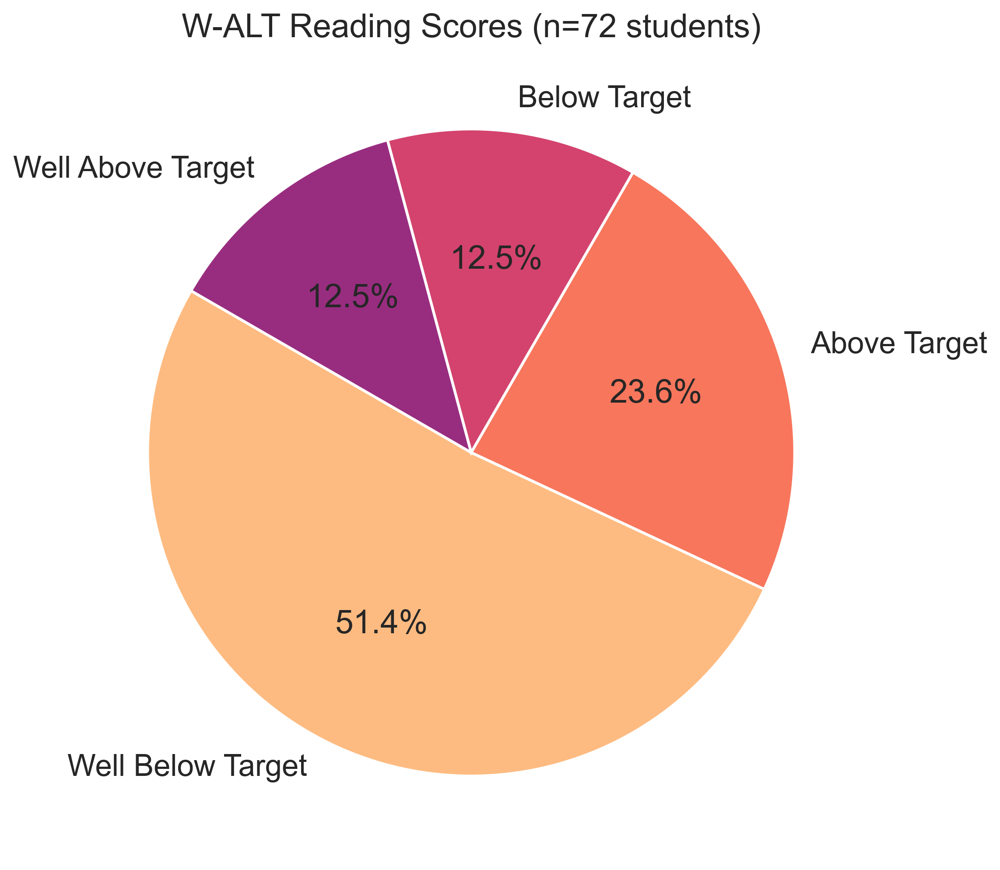

In [128]:
count=walt_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(walt_reading, labels=walt_reading.index, autopct='%1.1f%%', startangle=150)

plt.title(f'W-ALT Reading Scores (n={count} students)')
plt.savefig('Outputs/walt_reading')
plt.show()

In [59]:
walt_df[~walt_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()

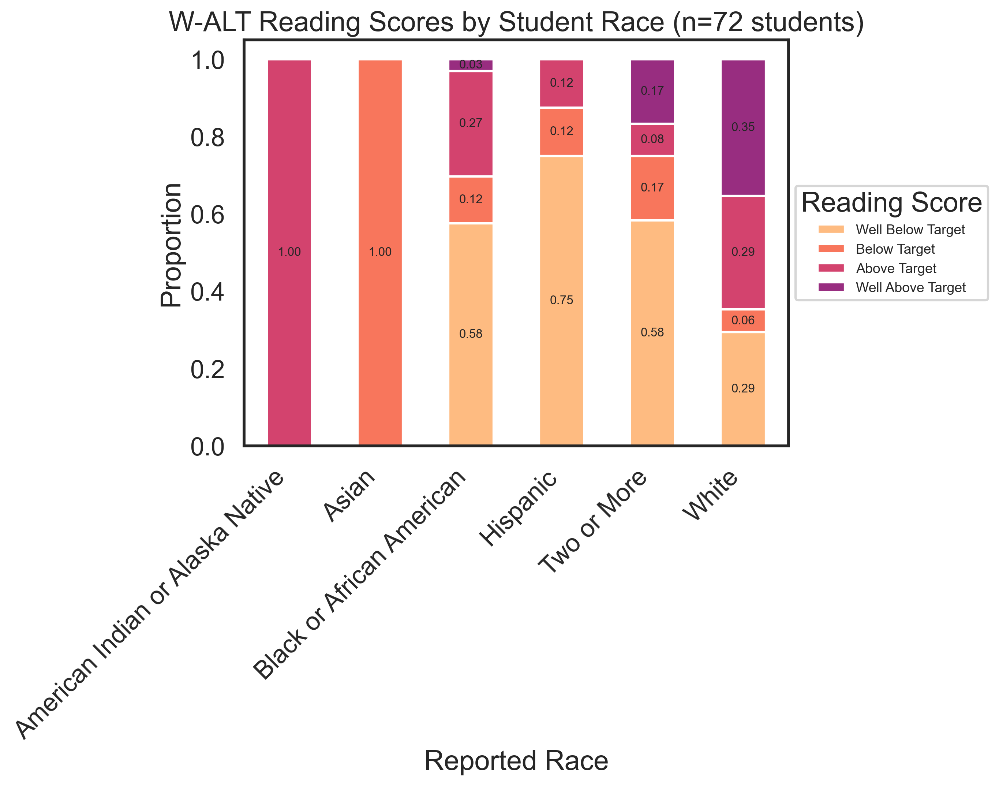

In [60]:
# Stacked Chart by Race

count=walt_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = walt_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'W-ALT Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/walt_reading_by_race', bbox_inches='tight')

In [61]:
walt_math=walt_df['Most Recent Math'].value_counts()
walt_math

Most Recent Math
Well Below Target    48
Below Target         12
Above Target          2
Name: count, dtype: int64

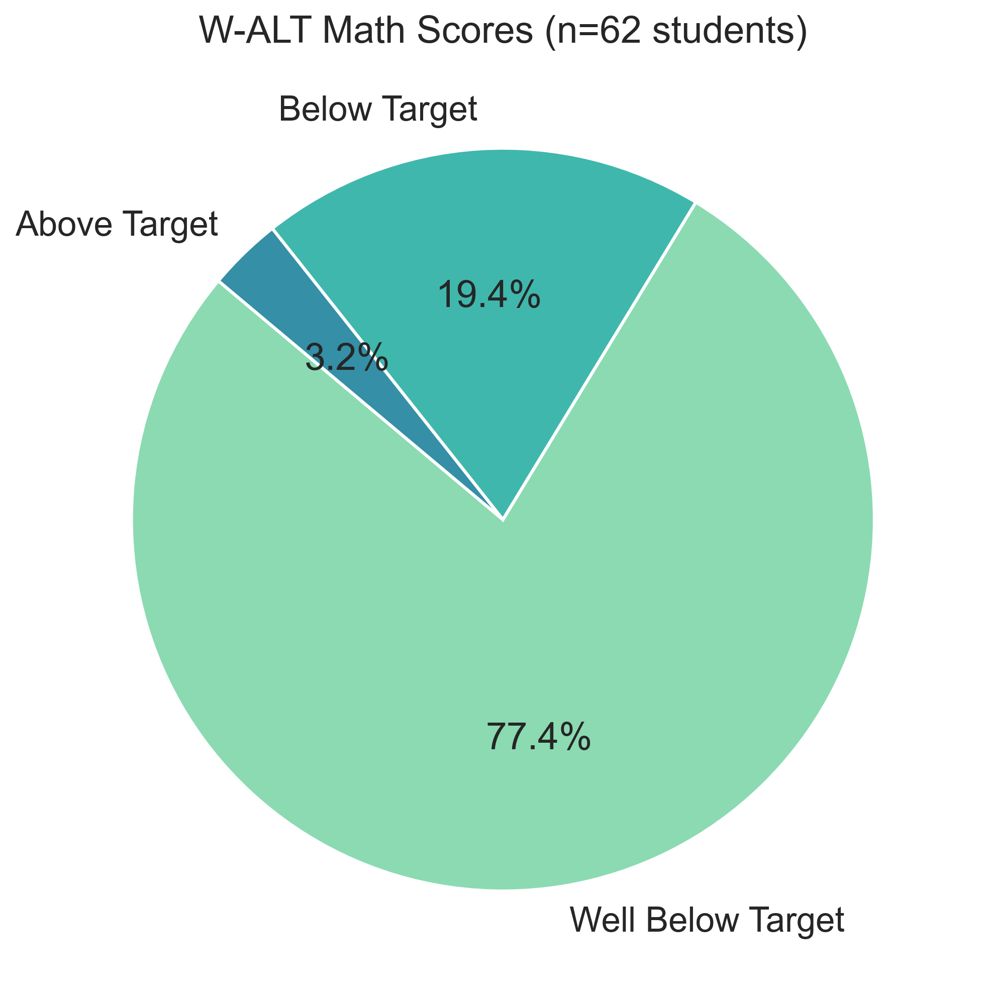

In [62]:
count=walt_df['Most Recent Math'].count()

sns.set_palette('mako_r')
plt.figure(figsize=(8, 8))

plt.pie(walt_math, labels=walt_math.index, autopct='%1.1f%%', startangle=140)

plt.title(f'W-ALT Math Scores (n={count} students)')
plt.savefig('Outputs/walt_math')
plt.show()

In [63]:
walt_df[~walt_df['Most Recent Math'].isna()]['Reported Race'].value_counts().to_clipboard()

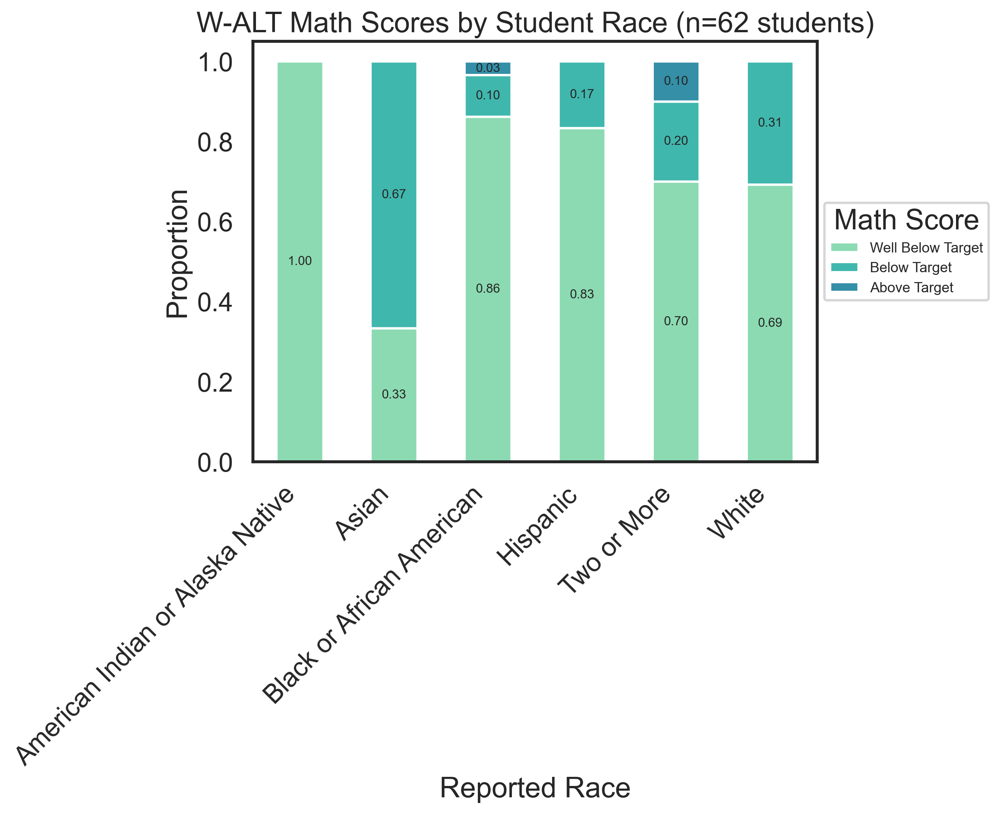

In [64]:
# Stacked Chart by Race

count=walt_df['Most Recent Math'].count()

# stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_order=['Well Below Target', 'Below Target', 'Above Target']

stacked_df  = walt_df.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'W-ALT Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/walt_math_by_race', bbox_inches='tight')

## CTC

In [65]:
ctc_df=results_df[results_df['School']=='CTC Tier 1 Trn']
ctc_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
69,CTC,301CT,"Carlson, Ciara E.",3677871.0,15.0,Two or More,Well Below Target,NaN,2024-10-23,Well Below Target,NaN,2024-10-23,1.0,CTC Tier 1 Trn
100,CTC,301CT,"Castellanos, Marco A.",99638.0,15.0,Hispanic,Well Below Target,NaN,2024-10-15,Well Below Target,NaN,2024-10-14,1.0,CTC Tier 1 Trn
107,CTC,301CT,"Abdi, Siham M.",106052.0,15.0,Black or African American,Well Below Target,NaN,2024-10-14,Well Below Target,NaN,2024-10-14,1.0,CTC Tier 1 Trn
113,CTC,301CT,"Sanchez, Citlalli S.",40299.0,15.0,Hispanic,Well Below Target,NaN,2024-10-14,Well Below Target,NaN,2024-10-14,1.0,CTC Tier 1 Trn
112,CTC,301CT,"Salem Anandaraj, Viswajith",113008.0,15.0,Asian,Well Below Target,NaN,2024-10-14,Well Below Target,NaN,2024-10-14,1.0,CTC Tier 1 Trn


In [66]:
ctc_df['Program'].value_counts()

Program
301CT    15
Name: count, dtype: int64

In [67]:
ctc_reading=ctc_df['Most Recent Reading'].value_counts()
ctc_reading

Most Recent Reading
Well Below Target    7
Above Target         2
Well Above Target    2
Below Target         1
Name: count, dtype: int64

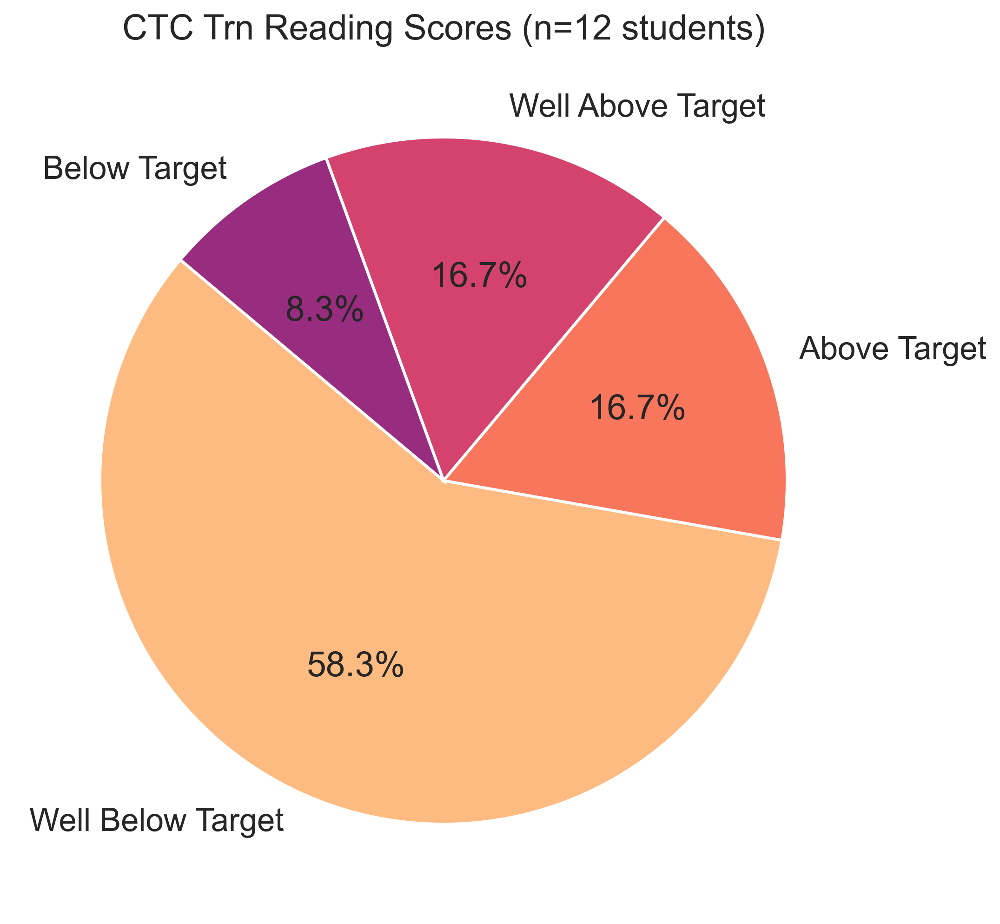

In [68]:
count=ctc_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(ctc_reading, labels=ctc_reading.index, autopct='%1.1f%%', startangle=140)

plt.title(f'CTC Trn Reading Scores (n={count} students)')
plt.savefig('Outputs/ctc_reading')
plt.show()

In [69]:
ctc_df[~ctc_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()

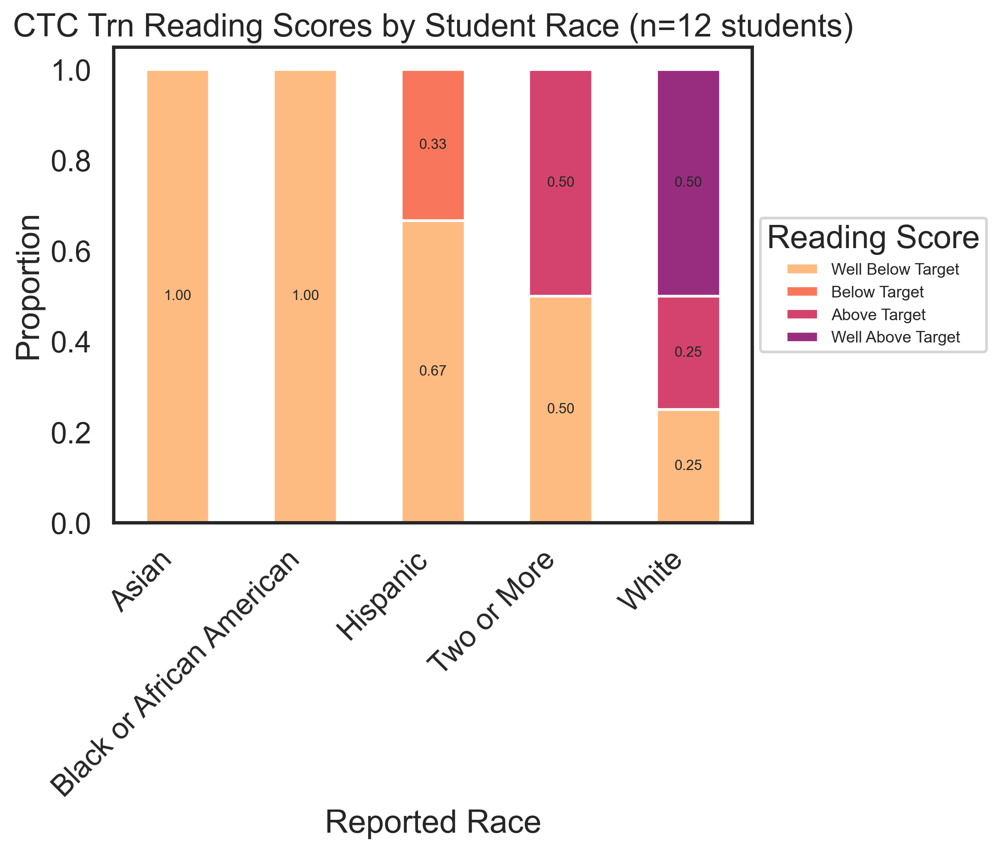

In [70]:
# Stacked Chart by Race

count=ctc_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = ctc_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'CTC Trn Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/ctc_reading_by_race', bbox_inches='tight')

In [71]:
ctc_df['Reported Race'].value_counts()

Reported Race
White                        5
Two or More                  3
Hispanic                     3
Black or African American    3
Asian                        1
Name: count, dtype: int64

In [72]:
ctc_math=ctc_df['Most Recent Math'].value_counts()
ctc_math

Most Recent Math
Well Below Target    10
Below Target          4
Name: count, dtype: int64

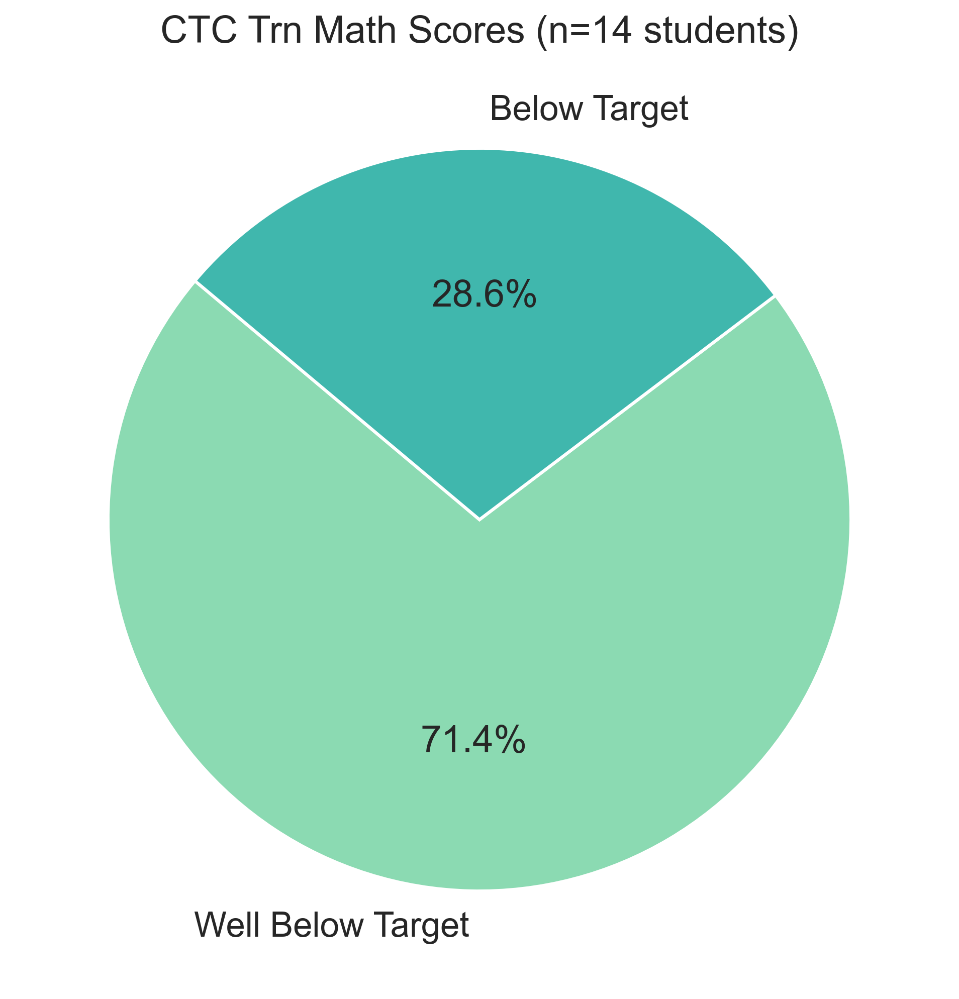

In [73]:
count=ctc_df['Most Recent Math'].count()

sns.set_palette('mako_r')
plt.figure(figsize=(8, 8))

plt.pie(ctc_math, labels=ctc_math.index, autopct='%1.1f%%', startangle=140)

plt.title(f'CTC Trn Math Scores (n={count} students)')
plt.savefig('Outputs/ctc_math')
plt.show()

In [74]:
ctc_df[~ctc_df['Most Recent Math'].isna()]['Reported Race'].value_counts().to_clipboard()

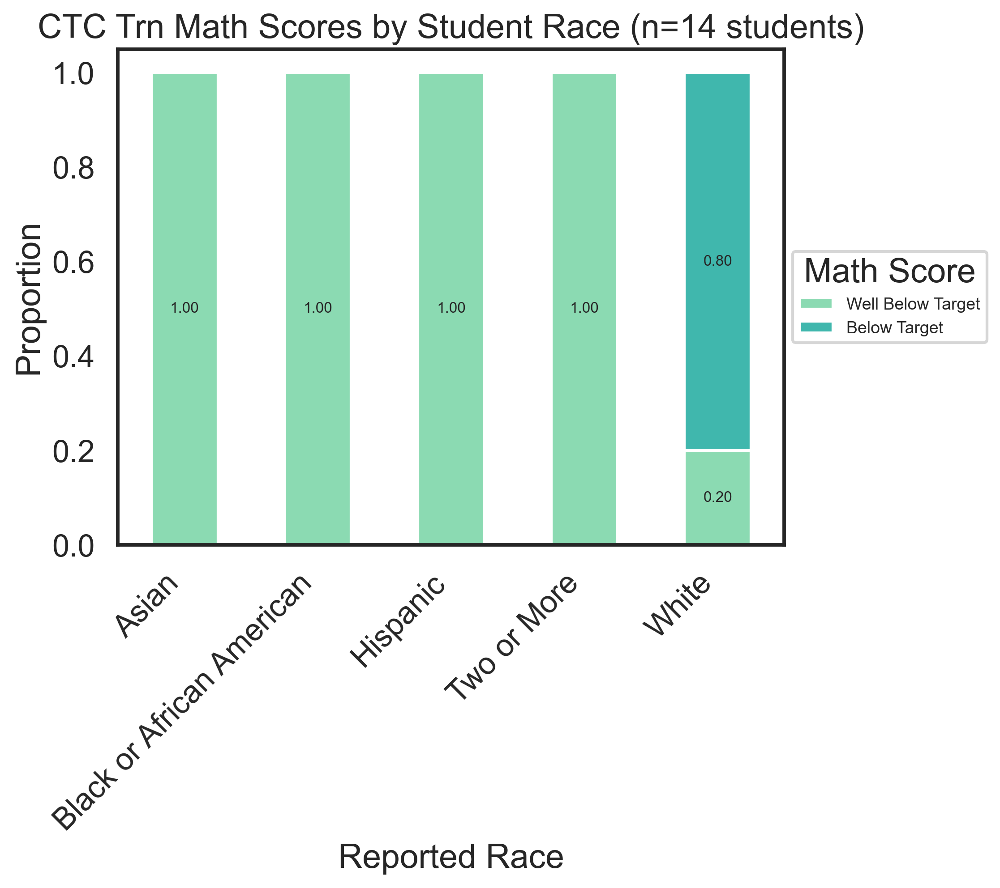

In [75]:
# Stacked Chart by Race

count=ctc_df['Most Recent Math'].count()

stacked_order=['Well Below Target', 'Below Target']

stacked_df  = ctc_df.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'CTC Trn Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/ctc_math_by_race', bbox_inches='tight')

## Gateway

In [76]:
gateway_df=results_df[results_df['School']=='CTC Gateway']
gateway_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
146,CTC,0801,"Ceesay, Makumba",3669642.0,14.0,Black or African American,Well Below Target,NaN,2024-10-07,Well Below Target,NaN,2024-10-10,1.0,CTC Gateway
142,CTC,0801,"Mancia Rivera, Fatima V.",3680530.0,12.0,Hispanic,Well Below Target,NaN,2024-10-07,NaN,NaN,NaT,1.0,CTC Gateway
138,CTC,0801,"Dombeck, Lilith M.",118563.0,12.0,White,Well Below Target,NaN,2024-10-07,Well Below Target,NaN,2024-10-10,1.0,CTC Gateway
134,CTC,0801,"Andrade, Sophia L.",3680388.0,12.0,Hispanic,Well Below Target,NaN,2024-10-07,NaN,NaN,NaT,1.0,CTC Gateway
133,CTC,0801,"Ahmedov, Ahmadjon",3680288.0,12.0,Two or More,Well Below Target,NaN,2024-10-07,Below Target,NaN,2024-10-10,1.0,CTC Gateway


In [77]:
gateway_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34 entries, 146 to 565
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Site                 34 non-null     object        
 1   Program              34 non-null     object        
 2   Student              34 non-null     object        
 3   District287 Id       34 non-null     float64       
 4   Grade                34 non-null     float64       
 5   Reported Race        34 non-null     object        
 6   Most Recent Reading  30 non-null     object        
 7   F-S Read Growth      0 non-null      float64       
 8   Reading Date         30 non-null     datetime64[ns]
 9   Most Recent Math     22 non-null     object        
 10  F-S Math Growth      0 non-null      float64       
 11  Math Date            22 non-null     datetime64[ns]
 12  Reading Level        30 non-null     float64       
 13  School               34 non-null     ob

In [78]:
gateway_reading=gateway_df['Most Recent Reading'].value_counts()
gateway_reading

Most Recent Reading
Well Below Target    10
Well Above Target     9
Above Target          6
Below Target          5
Name: count, dtype: int64

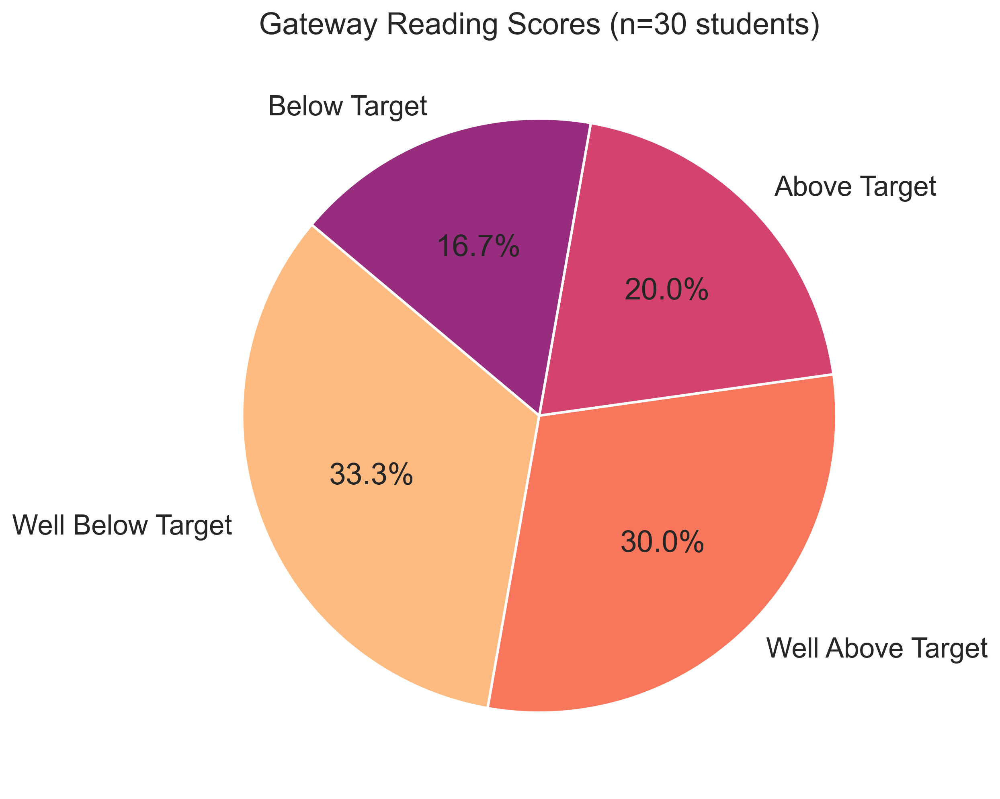

In [79]:
count=gateway_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(gateway_reading, labels=gateway_reading.index, autopct='%1.1f%%', startangle=140)

plt.title(f'Gateway Reading Scores (n={count} students)')
plt.savefig('Outputs/gateway_reading')
plt.show()

In [80]:
gateway_df[~gateway_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()

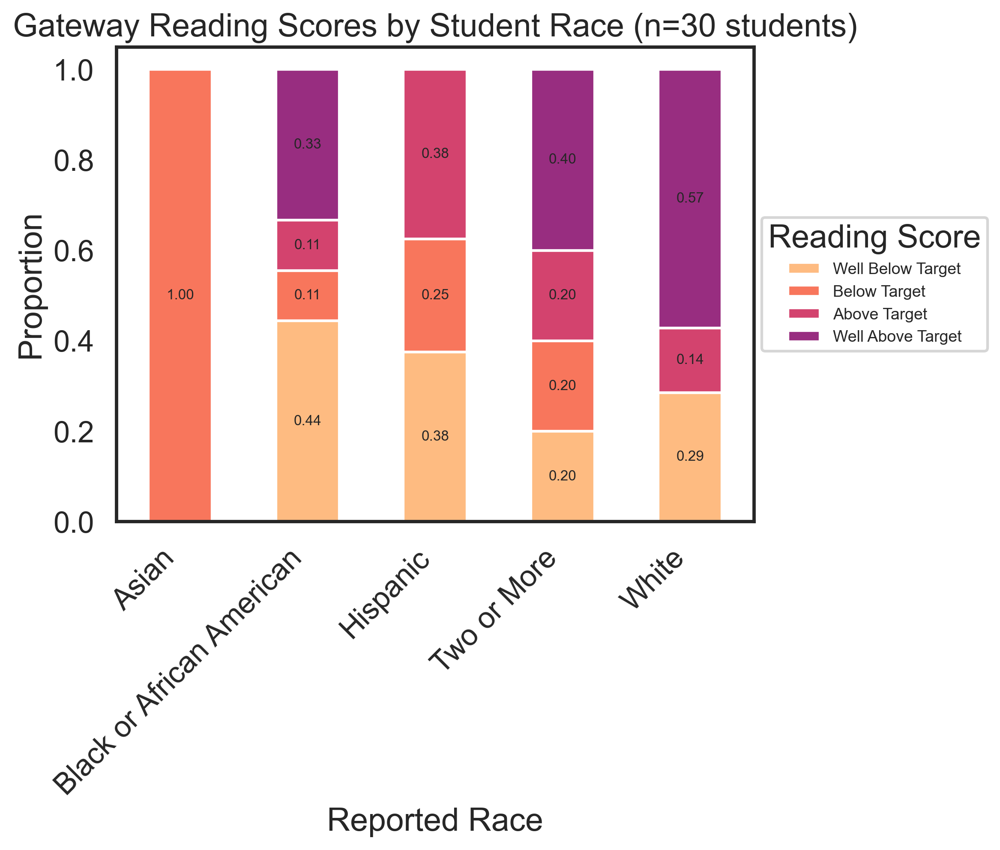

In [81]:
# Stacked Chart by Race

count=gateway_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = gateway_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'Gateway Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/gateway_reading_by_race', bbox_inches='tight')

In [82]:
gateway_df['Reported Race'].value_counts()

Reported Race
Black or African American    10
White                         9
Hispanic                      8
Two or More                   6
Asian                         1
Name: count, dtype: int64

In [83]:
gateway_math=gateway_df['Most Recent Math'].value_counts()
gateway_math

Most Recent Math
Well Below Target    11
Below Target          8
Above Target          2
Well Above Target     1
Name: count, dtype: int64

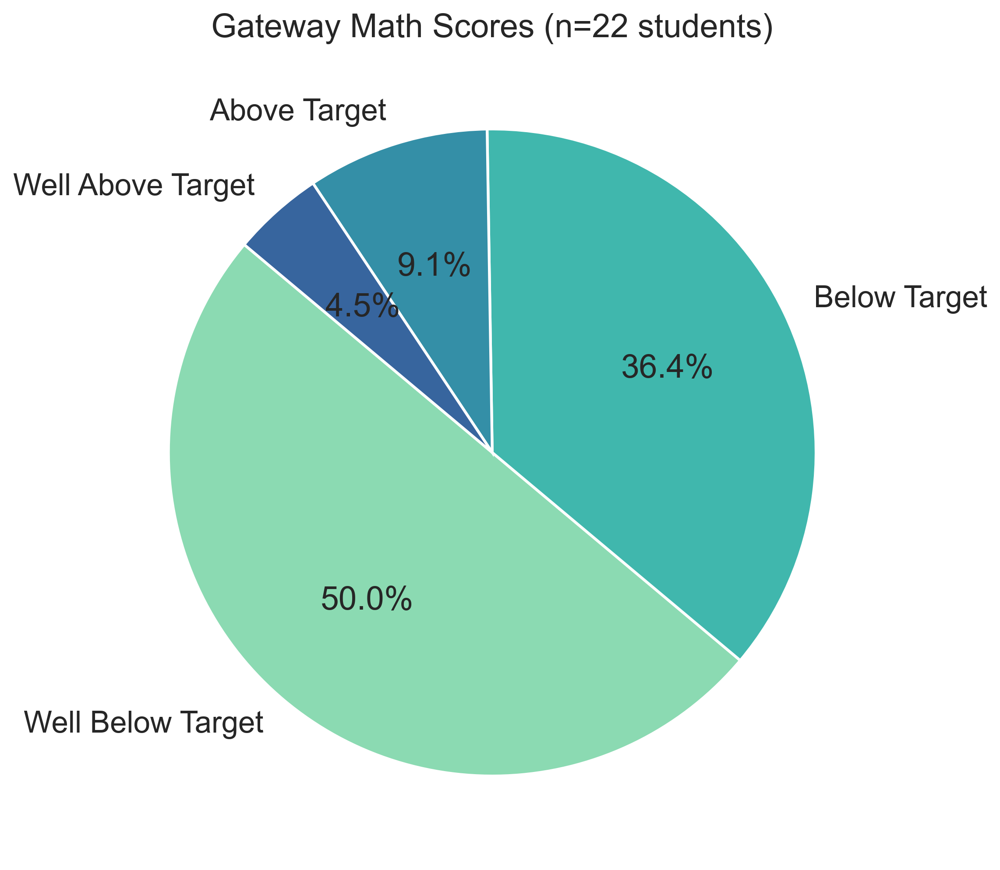

In [84]:
count=gateway_df['Most Recent Math'].count()

sns.set_palette('mako_r')
plt.figure(figsize=(8, 8))

plt.pie(gateway_math, labels=gateway_math.index, autopct='%1.1f%%', startangle=140)

plt.title(f'Gateway Math Scores (n={count} students)')
plt.savefig('Outputs/gateway_math')
plt.show()

In [85]:
gateway_df[~gateway_df['Most Recent Math'].isna()]['Reported Race'].value_counts().to_clipboard()

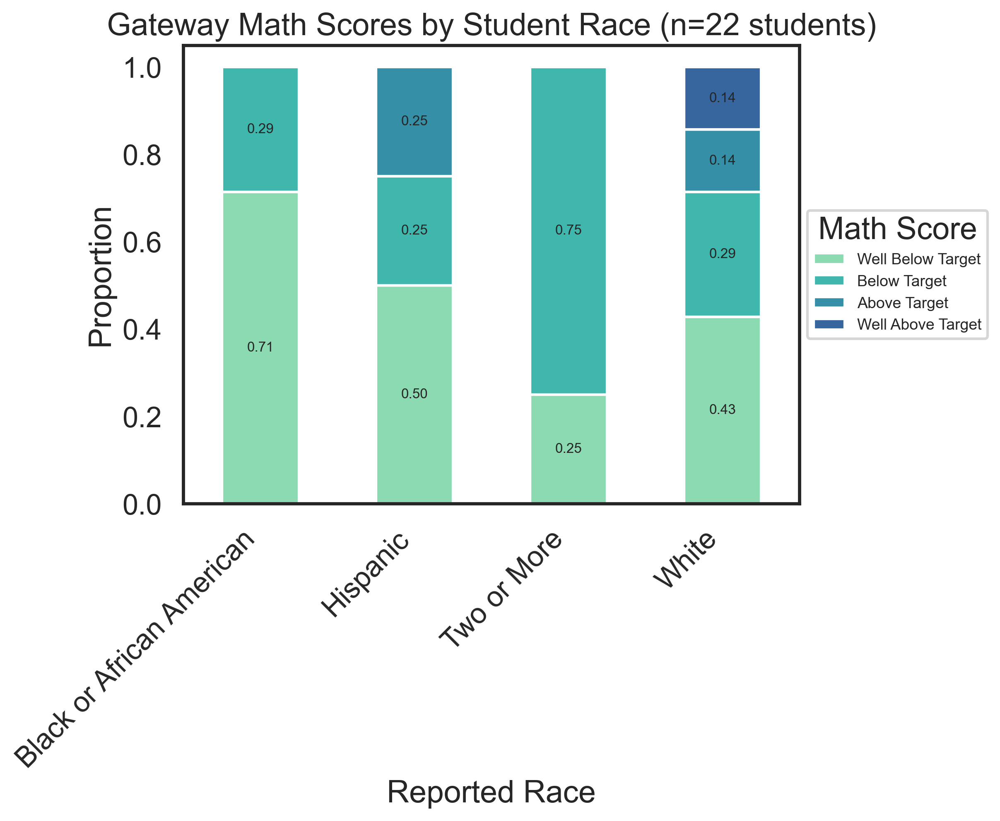

In [86]:
# Stacked Chart by Race

count=gateway_df['Most Recent Math'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']

stacked_df  = gateway_df.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'Gateway Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/gateway_math_by_race', bbox_inches='tight')

## ABEC

In [87]:
abec_df=results_df[results_df['School']=='ABEC']
abec_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
299,ABEC,302AT,"Parker, Galilee Q.",44890.0,15.0,Black or African American,Well Below Target,NaN,2024-09-17,Well Below Target,NaN,2024-09-10,1.0,ABEC
309,ABEC,302A,"Tarman, Carter J.",131758.0,11.0,White,Well Below Target,NaN,2024-09-16,Well Below Target,NaN,2024-09-16,1.0,ABEC
355,ABEC,302A,"Mohamed, Ali M.",3663566.0,11.0,Black or African American,Well Below Target,NaN,2024-09-12,Well Below Target,NaN,2024-09-11,1.0,ABEC
350,ABEC,302A,"Feazell, Ja'Various D.",3648126.0,11.0,Black or African American,Well Below Target,NaN,2024-09-12,Well Below Target,NaN,2024-09-17,1.0,ABEC
235,ABEC,302A,"Wilzard, Daniel N.",123931.0,10.0,Black or African American,Well Below Target,NaN,2024-09-23,Well Below Target,NaN,2024-09-09,1.0,ABEC


In [88]:
abec_reading=abec_df['Most Recent Reading'].value_counts()
abec_reading

Most Recent Reading
Well Below Target    52
Well Above Target     4
Below Target          3
Above Target          2
Name: count, dtype: int64

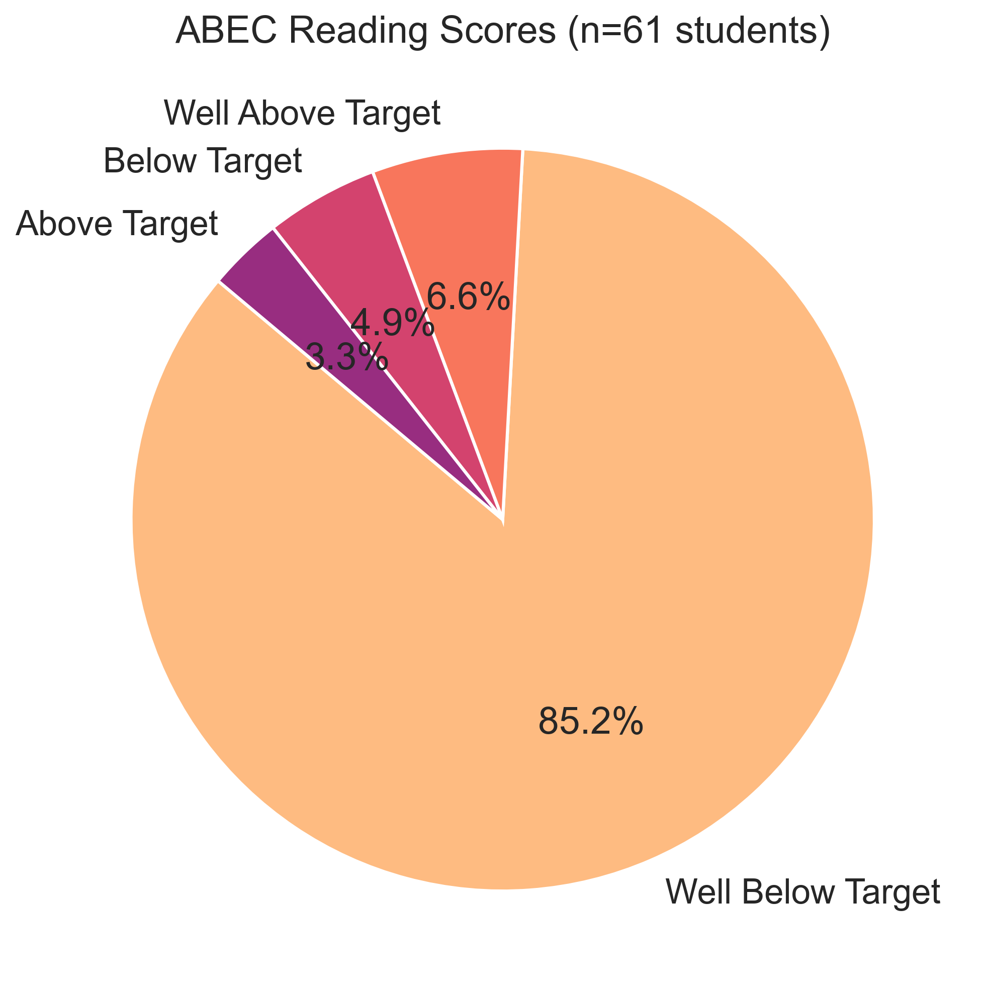

In [89]:
count=abec_df['Most Recent Reading'].count()

sns.set_palette('magma_r')
plt.figure(figsize=(8, 8))
plt.pie(abec_reading, labels=abec_reading.index, autopct='%1.1f%%', startangle=140)

plt.title(f'ABEC Reading Scores (n={count} students)')
plt.savefig('Outputs/abec_reading')
plt.show()

In [90]:
abec_df[~abec_df['Most Recent Reading'].isna()]['Reported Race'].value_counts().to_clipboard()

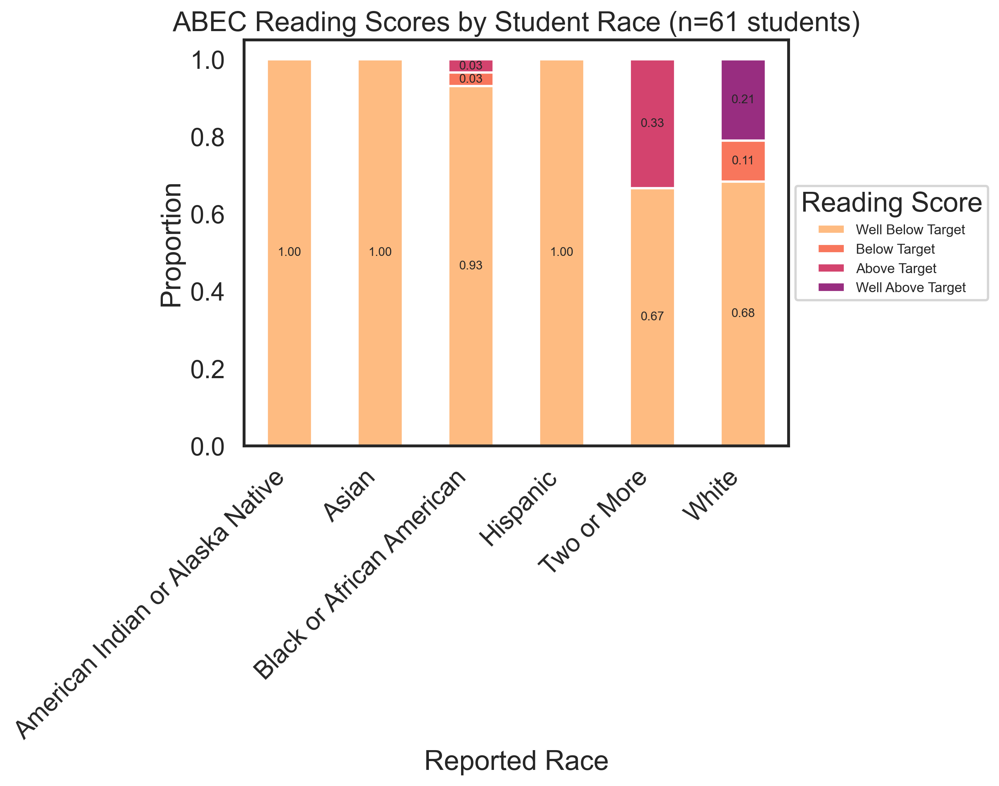

In [91]:
# Stacked Chart by Race

count=abec_df['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = abec_df.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'ABEC Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/abec_reading_by_race', bbox_inches='tight')

In [92]:
abec_df['Reported Race'].value_counts()

Reported Race
Black or African American           29
White                               23
Hispanic                             8
Two or More                          3
Asian                                2
American Indian or Alaska Native     1
Name: count, dtype: int64

In [93]:
abec_math=abec_df['Most Recent Math'].value_counts()
abec_math

Most Recent Math
Well Below Target    52
Below Target          3
Well Above Target     1
Above Target          1
Name: count, dtype: int64

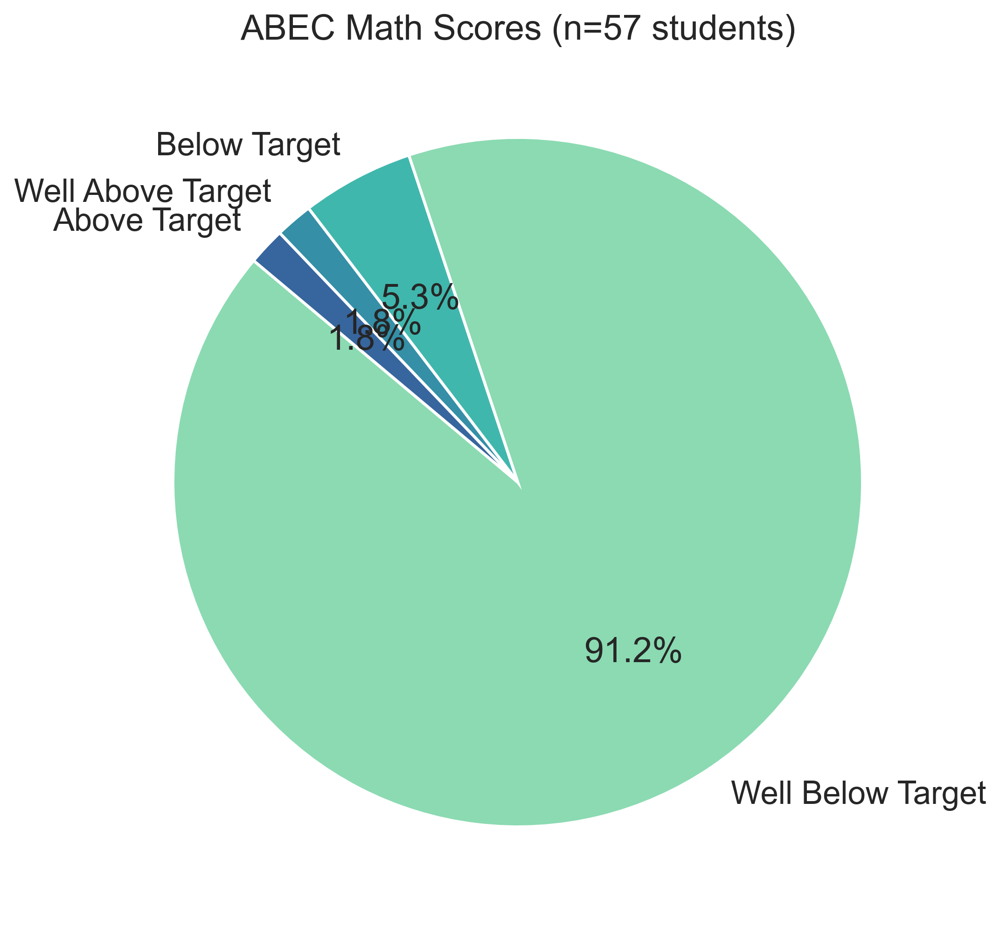

In [94]:
count=abec_df['Most Recent Math'].count()

sns.set_palette('mako_r')
plt.figure(figsize=(8, 8))

plt.pie(abec_math, labels=abec_math.index, autopct='%1.1f%%', startangle=140)

plt.title(f'ABEC Math Scores (n={count} students)')
plt.savefig('Outputs/abec_math')
plt.show()

In [95]:
abec_df[~abec_df['Most Recent Math'].isna()]['Reported Race'].value_counts().to_clipboard()

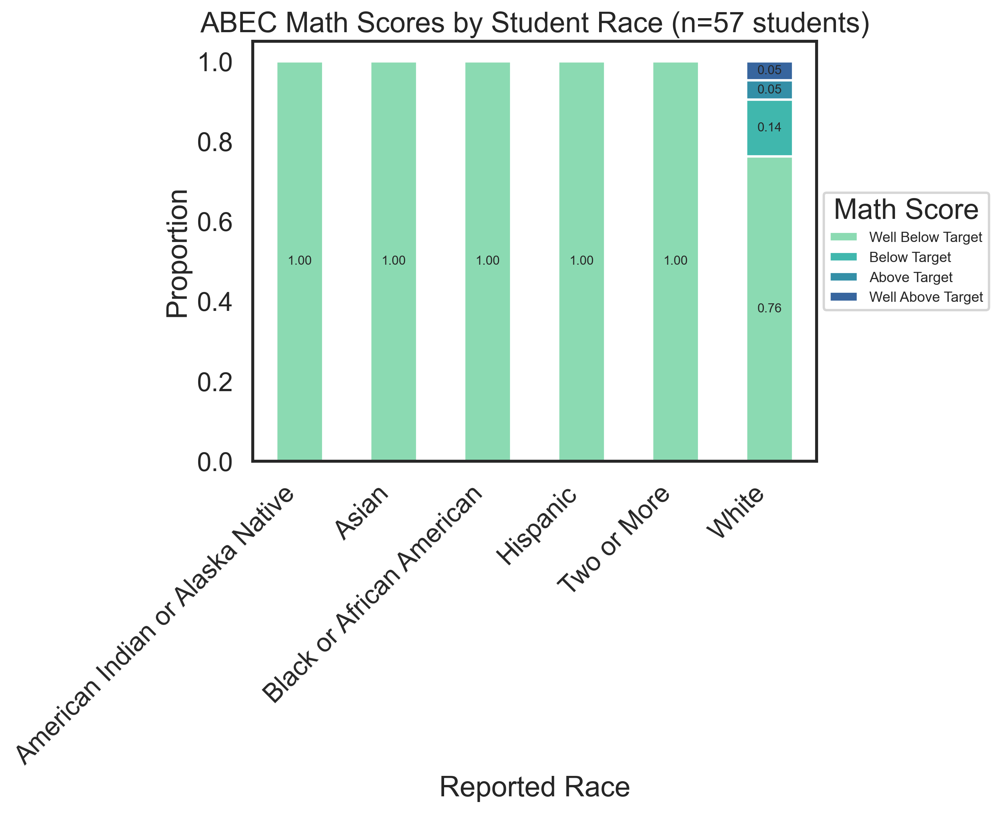

In [96]:
# Stacked Chart by Race

count=abec_df['Most Recent Math'].count()

# stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']

stacked_df  = abec_df.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'ABEC Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/abec_math_by_race', bbox_inches='tight')

In [97]:
all_schools=results_df[~results_df['School'].isna()]
all_schools['School'].value_counts()

School
NEC SPED          126
W-ALT              83
SEC SPED           77
ABEC               66
WEC SPED           50
CTC Gateway        34
SECA               32
NECA               24
CTC Tier 1 Trn     15
CTC Pathways        1
Name: count, dtype: int64

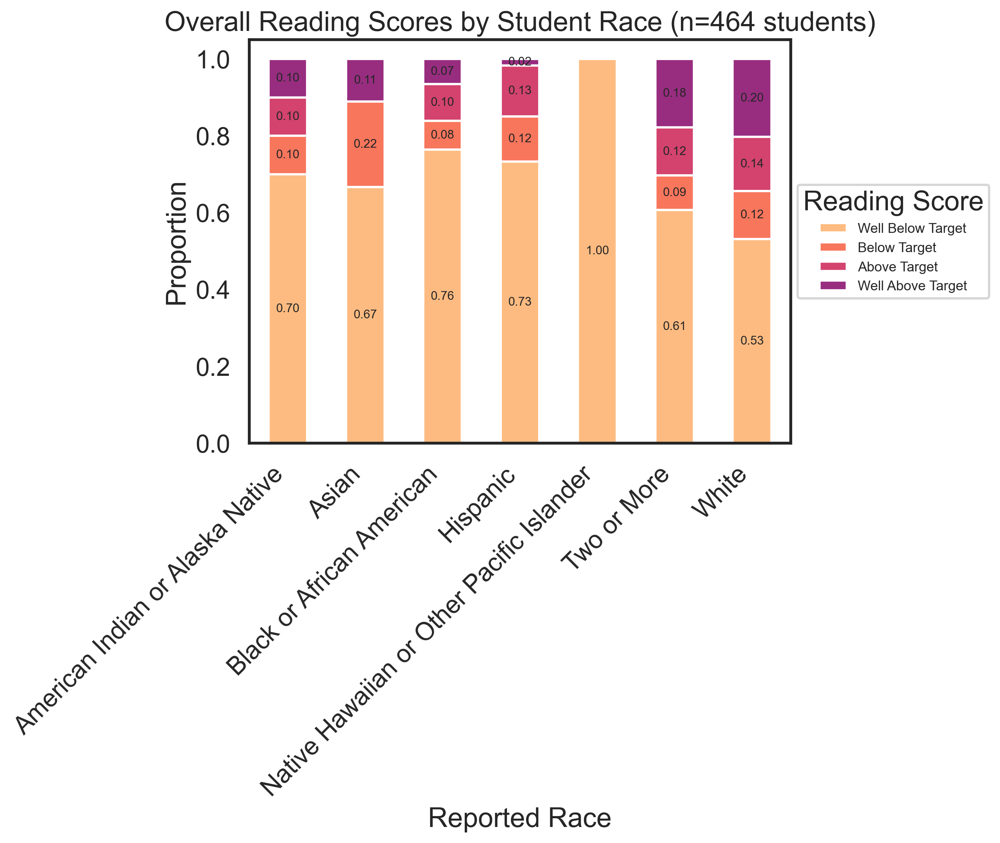

In [98]:
# Stacked Chart by Race

count=all_schools['Most Recent Reading'].count()

stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_df  = all_schools.groupby('Reported Race')['Most Recent Reading'].value_counts(normalize=True).unstack('Most Recent Reading')
stacked_df = stacked_df[stacked_order]

sns.set_palette('magma_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Reading Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'Overall Reading Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/overall_reading_by_race', bbox_inches='tight')

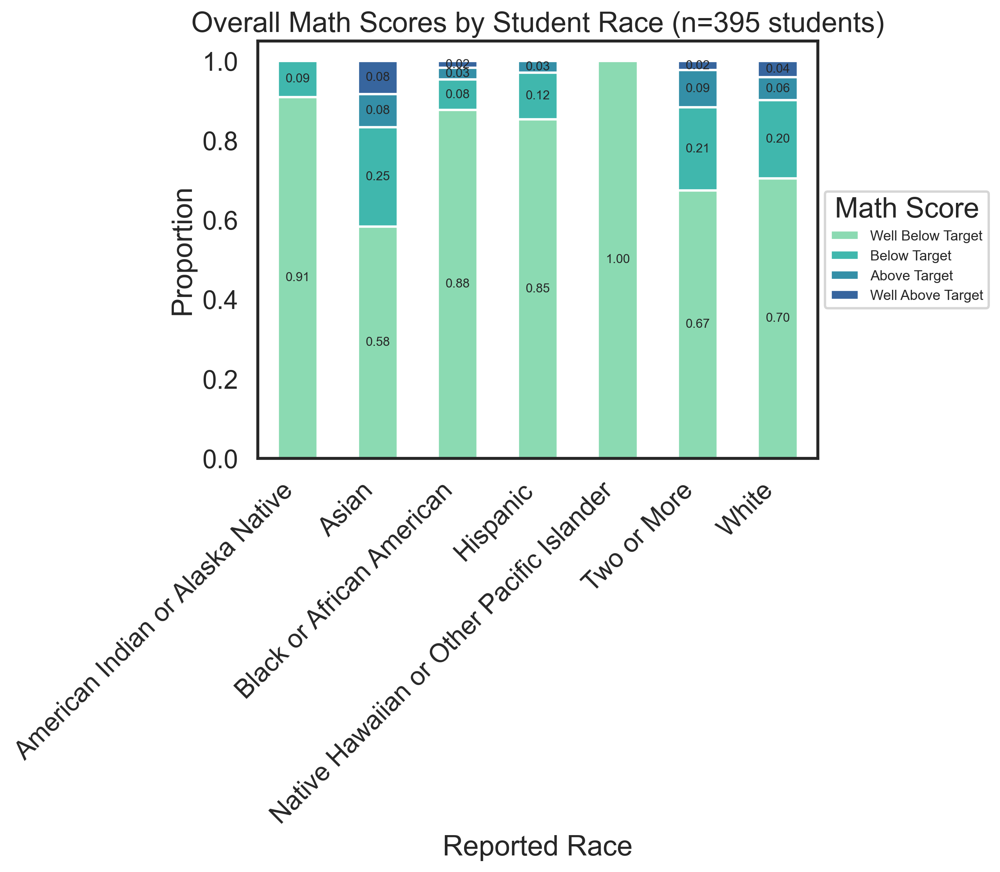

In [99]:
# Stacked Chart by Race

count=all_schools['Most Recent Math'].count()

# stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']
stacked_order=['Well Below Target', 'Below Target', 'Above Target', 'Well Above Target']

stacked_df  = all_schools.groupby('Reported Race')['Most Recent Math'].value_counts(normalize=True).unstack('Most Recent Math')
stacked_df = stacked_df[stacked_order]

sns.set_palette('mako_r')

ax = stacked_df.plot.bar(stacked=True)

legend=ax.legend(title='Math Score', loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

ax.set_title(f'Overall Math Scores by Student Race (n={count} students)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_ylabel('Proportion')

for c in ax.containers:
    
    # customize the label to account for cases when there might not be a bar section
    labels = [f'{h:.2f}' if (h := v.get_height()) > 0 else '' for v in c ]
    
    # set the bar label
    ax.bar_label(c, labels=labels, label_type='center', fontsize=8)

plt.savefig('Outputs/overall_math_by_race', bbox_inches='tight')

In [100]:
all_schools['Reported Race'].value_counts().to_clipboard()

## Pathways

In [101]:
pathways_df=results_df[results_df['School']=='CTC Pathways']
pathways_df.head()

,Site,Program,Student,District287 Id,Grade,Reported Race,Most Recent Reading,F-S Read Growth,Reading Date,Most Recent Math,F-S Math Growth,Math Date,Reading Level,School
550,CTC,0032,"Crooks, Maxwell A.",3678800.0,12.0,White,NaN,NaN,NaT,Well Below Target,NaN,2024-09-23,NaN,CTC Pathways


In [102]:
pathways_reading=pathways_df['Most Recent Reading'].value_counts()
pathways_reading

Series([], Name: count, dtype: int64)

In [103]:
pathways_math=pathways_df['Most Recent Math'].value_counts()
pathways_math

Most Recent Math
Well Below Target    1
Name: count, dtype: int64